In [5]:
from PIL import Image
import matplotlib.pyplot as plt
from scipy.io import loadmat, savemat
from scipy.signal import hilbert
import numpy as np

In [9]:
folder_name = "GTinvivo_sigma_20"

In [4]:
!python main.py --ni --config deblur_invivoGT.yml --doc imagenet_ood --timesteps 20 --eta 0.85 --etaB 1 --deg deblur_bccb --sigma_0 20 -i {folder_name}

Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-06-02 13:18:56,315 - Using device: cuda
INFO - main.py - 2025-06-02 13:18:56,319 - Writing log file to exp/logs/imagenet_ood
INFO - main.py - 2025-06-02 13:18:56,320 - Exp instance id = 2347671
INFO - main.py - 2025-06-02 13:18:56,320 - Exp comment = 
building dataset from exp/invivoGT.txt
read meta done
Start from 0
  0%|                                                     | 0/1 [00:

Fake Ground Truth


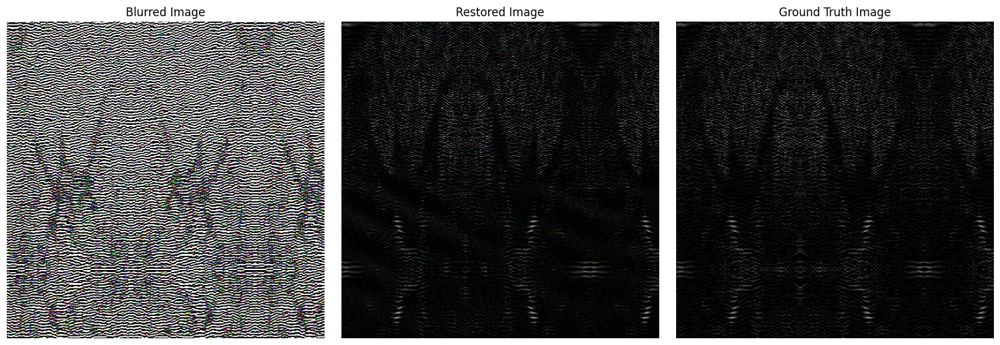

In [6]:


print('Fake Ground Truth')
# Specify the paths to your image files
image_path_restored = 'exp/image_samples/'+folder_name+'/0_-1.png'
image_path_GT = 'exp/image_samples/'+folder_name+'/orig_0.png'
image_path_blurred = 'exp/image_samples/'+folder_name+'/y0_0.png'

# Create a figure to hold the images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# List of images and titles
images = [(image_path_blurred, "Blurred Image"),
          (image_path_restored, "Restored Image"),
          (image_path_GT, "Ground Truth Image")]

# Loop through the images and display them
for ax, (image_path, title) in zip(axes, images):
    img = Image.open(image_path)
    ax.imshow(img)
    ax.axis('off')  # Hide axes
    ax.set_title(title)

plt.tight_layout()  # Adjust layout
plt.show()




In [6]:
folder_name = "512VivoNoDiv_SumDiv60_20it_sigma_20"

In [43]:
folder_name = "My_inivo/oldVivo100it20sigma"

In [44]:
!python main.py --ni --config deblur_invivo.yml --doc imagenet_ood --timesteps 100 --eta 0.85 --etaB 1 --deg deblur_bccb --sigma_0 20 -i {folder_name}

Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-08-29 21:31:39,386 - Using device: cuda
INFO - main.py - 2025-08-29 21:31:39,387 - Writing log file to exp/logs/imagenet_ood
INFO - main.py - 2025-08-29 21:31:39,387 - Exp instance id = 987534
INFO - main.py - 2025-08-29 21:31:39,387 - Exp comment = 
building dataset from exp/invivo.txt
read meta done
Start from 0
  0%|                                                     | 0/1 [00:00<

RF raw range:       min = -0.9099, max = 1.0000
Tikhonov range:     min = -1.0000, max = 0.8366
DDRM range:         min = -1.0000, max = 0.8286


/tmp/ipykernel_981507/2452824084.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 1])   # instead of plain plt.tight_layout()


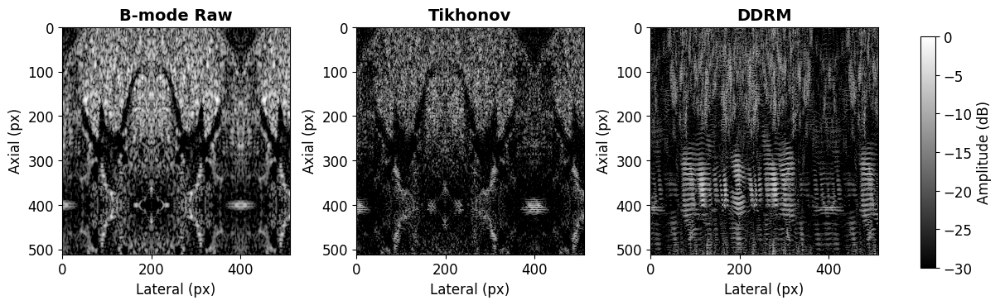

Saved: exp/image_samples/My_inivo/oldVivo100it20sigma/Bmode_Comparison_before_cropping.pdf


/tmp/ipykernel_981507/2452824084.py:150: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 1])   # instead of plain plt.tight_layout()


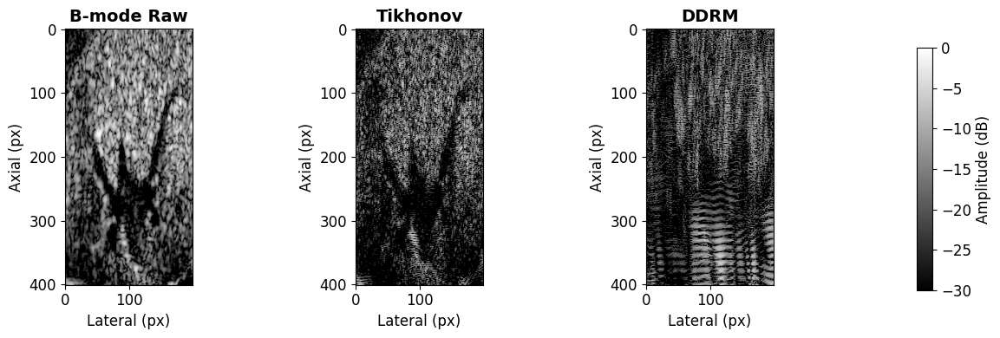

Saved: exp/image_samples/My_inivo/oldVivo100it20sigma/Bmode_Comparison_after_cropping.pdf


In [45]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
from scipy.signal import hilbert

# 1. Load raw RF data
data = loadmat('exp/datasets/invivo/invivo.mat')
rf = data['data']
rfn = rf / np.max(np.abs(rf))  # Normalize RF

# 2. Tikhonov restoration (Wiener filter)
psf_data = loadmat('exp/datasets/invivo/psf_estim_vivo.mat')
H = psf_data['psf_estim_vivo']
h = H / np.sum(np.abs(H))

Mh, Nh = h.shape
Mrf, Nrf = rf.shape
center = np.round([Mh, Nh]) / 2

# Create BCCB degradation operator
pad_h = np.pad(h, ((0, Mrf - Mh), (0, Nrf - Nh)), mode='constant')
pad_h = np.roll(pad_h, int(1 - center[0]), axis=0)
pad_h = np.roll(pad_h, int(1 - center[1]), axis=1)
D = np.fft.fft2(pad_h)

SNR_val = 500  # ~30 dB
VivoTK = np.fft.ifft2(np.fft.fft2(rfn) * np.conj(D) / (1/SNR_val + np.conj(D)*D))
VivoTK = np.real(VivoTK)
VivoTK /= np.max(np.abs(VivoTK))

# 3. DDRM restoration
#ddrm_data = loadmat('exp/image_samples/My_inivo/oldVivo50it25sigma/0_-1.mat')
#ddrm_data = loadmat(f"exp/image_samples/{folder_name}/0_-1.mat")


ddrm_path = os.path.join("exp", "image_samples", folder_name, "0_-1.mat")
ddrm_data = loadmat(ddrm_path)

image = ddrm_data['image']
if image.ndim == 3:
    image = np.transpose(image, (1, 2, 0))
grayimage = np.mean(image, axis=2) if image.ndim == 3 else image
grayimage = grayimage / np.max(np.abs(grayimage))  # Normalization

# 4. Envelope detection and log compression
M1, N1 = rf.shape
M2, N2 = VivoTK.shape
M3, N3 = grayimage.shape
M, N = min(M1, M2, M3), min(N1, N2, N3)

# Crop to common size
rf = rf[:M, :N]
VivoTK = VivoTK[:M, :N]
grayimage = grayimage[:M, :N]

# Envelope + Log Compression
env_raw = np.abs(hilbert(rf, axis=0))
env_raw /= np.max(env_raw)
bmode_raw = 20 * np.log10(env_raw + np.finfo(float).eps)

env_tikh = np.abs(VivoTK)
env_tikh /= np.max(env_tikh)
bmode_tikh = 20 * np.log10(env_tikh + np.finfo(float).eps)

env_ddrm = np.abs(grayimage)
env_ddrm /= np.max(env_ddrm)
bmode_ddrm = 20 * np.log10(env_ddrm + np.finfo(float).eps)

# 5. Print statistics
print(f'RF raw range:       min = {np.min(rfn):.4f}, max = {np.max(rfn):.4f}')
print(f'Tikhonov range:     min = {np.min(VivoTK):.4f}, max = {np.max(VivoTK):.4f}')
print(f'DDRM range:         min = {np.min(grayimage):.4f}, max = {np.max(grayimage):.4f}')
# 6. Simplified B-mode Visualization (Only 3 Results + Shared Colorbar + Axial Resolution Labels)
fig = plt.figure(figsize=(12,4))
fig.canvas.manager.set_window_title('B-mode Comparison')

titles = ['B-mode Raw', 'Tikhonov', 'DDRM']
images = [bmode_raw, bmode_tikh, bmode_ddrm]

# Plot all three B-mode results
for i in range(3):
    ax = plt.subplot(1, 3, i+1)
    im = ax.imshow(images[i], cmap='gray', vmin=-30, vmax=0, aspect='equal')
    ax.set_title(titles[i], fontsize=14, fontweight='bold')
    ax.set_xlabel('Lateral (px)', fontsize=12)
    ax.set_ylabel('Axial (px)', fontsize=12)
    ax.tick_params(labelsize=12)
    
    # Add axial resolution annotation (bottom-left corner)


# Add unified colorbar
plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.015, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Amplitude (dB)', fontsize=12)
cbar.ax.tick_params(labelsize=12)

#plt.suptitle('Ultrasound B-mode Comparison with Resolution', fontsize=16, fontweight='bold')
#plt.tight_layout()
plt.tight_layout(rect=[0, 0, 0.90, 1])   # instead of plain plt.tight_layout()

# --- Save as lossless (vector) PDF ---
#fig.savefig("Bmode_Comparison.pdf", bbox_inches="tight")  # axes/text stay vector; images embedded losslessly
plt.show()

import os
save_dir = os.path.join("exp", "image_samples", folder_name)
os.makedirs(save_dir, exist_ok=True)
out_pdf = os.path.join(save_dir, "Bmode_Comparison_before_cropping.pdf")
fig.savefig(out_pdf, bbox_inches="tight")  # vector PDF; images embedded losslessly
print("Saved:", out_pdf)

rows = slice(0, 401)   # 0..400
cols = slice(0, 200)   # 0..199

bmode_raw  = bmode_raw[rows, cols]
bmode_tikh = bmode_tikh[rows, cols]
bmode_ddrm = bmode_ddrm[rows, cols]

# 6. Simplified B-mode Visualization (Only 3 Results + Shared Colorbar + Axial Resolution Labels)
fig = plt.figure(figsize=(12,4))
fig.canvas.manager.set_window_title('B-mode Comparison')

titles = ['B-mode Raw', 'Tikhonov', 'DDRM']
images = [bmode_raw, bmode_tikh, bmode_ddrm]

# Plot all three B-mode results
for i in range(3):
    ax = plt.subplot(1, 3, i+1)
    im = ax.imshow(images[i], cmap='gray', vmin=-30, vmax=0, aspect='equal')
    ax.set_title(titles[i], fontsize=14, fontweight='bold')
    ax.set_xlabel('Lateral (px)', fontsize=12)
    ax.set_ylabel('Axial (px)', fontsize=12)
    ax.tick_params(labelsize=12)
    
    # Add axial resolution annotation (bottom-left corner)


# Add unified colorbar
plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.015, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Amplitude (dB)', fontsize=12)
cbar.ax.tick_params(labelsize=12)

#plt.suptitle('Ultrasound B-mode Comparison with Resolution', fontsize=16, fontweight='bold')
#plt.tight_layout()
plt.tight_layout(rect=[0, 0, 0.90, 1])   # instead of plain plt.tight_layout()

# --- Save as lossless (vector) PDF ---
#fig.savefig("Bmode_Comparison.pdf", bbox_inches="tight")  # axes/text stay vector; images embedded losslessly
plt.show()

import os
save_dir = os.path.join("exp", "image_samples", folder_name)
os.makedirs(save_dir, exist_ok=True)
out_pdf = os.path.join(save_dir, "Bmode_Comparison_after_cropping.pdf")
fig.savefig(out_pdf, bbox_inches="tight")  # vector PDF; images embedded losslessly
print("Saved:", out_pdf)

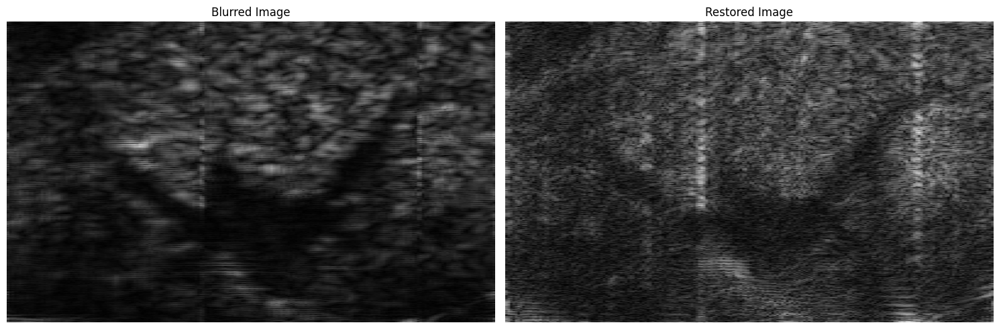

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
from scipy.signal import hilbert

image_path_restored = 'exp/image_samples/'+folder_name+'/0_-1.mat'
image_path_blurred = 'exp/image_samples/'+folder_name+'/y0_0.mat'
image_path_Tikhonov = 'exp/image_samples/'+folder_name+'/y0_0.mat'

# Create a figure to hold the images
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 3 columns

img = loadmat(image_path_blurred)['image']
ax = axes[0]
img = np.transpose(img, ([1, 2, 0]))
img = np.log(np.abs(hilbert(img[0:401,0:200,1]))+1000)
ax.imshow(img,cmap='gray')
ax.set_aspect('auto')  
ax.axis('off')  # Hide axes
ax.set_title("Blurred Image")

img = loadmat(image_path_restored)['image']
ax = axes[1]
img = np.transpose(img, ([1, 2, 0]))
img = np.log(np.abs(hilbert(img[0:401,0:200,1]))+1000)
ax.imshow(img,cmap='gray')
ax.set_aspect('auto')  
ax.axis('off')  # Hide axes
ax.set_title("Restored Image")


'''
# List of images and titles
images = [(image_path_blurred, "Blurred Image"),
          (image_path_restored, "Restored Image")]
# Loop through the images and display them
for ax, (image_path, title) in zip(axes, images):
    img = loadmat(image_path)['image']
    img = np.transpose(img, ([1, 2, 0]))
    img = np.log(np.abs(hilbert(img[:,:,1]))+100000)
    ax.imshow(img,cmap='gray')
    ax.axis('off')  # Hide axes
    ax.set_title(title)'''

plt.tight_layout()  # Adjust layout
plt.show()

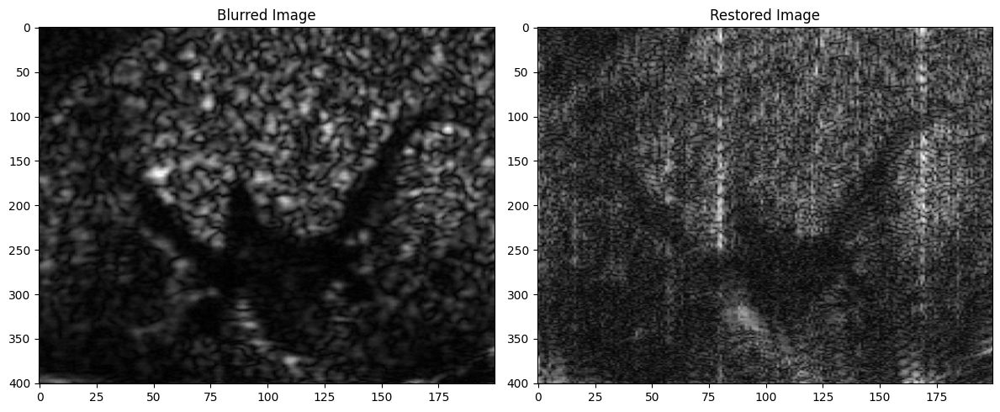

In [6]:
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Load the blurred and restored images
blurred_data = loadmat('exp/image_samples/My_inivo/y0_0.mat')['image']
restored_data = loadmat('exp/image_samples/My_inivo/0_-1.mat')['image']

# Transpose to (H, W, C)
blurred_img = np.transpose(blurred_data, (1, 2, 0))
restored_img = np.transpose(restored_data, (1, 2, 0))

# Apply Hilbert transform and log compression
bmode_blurred = np.log(np.abs(hilbert(blurred_img[0:401, 0:200, 1], axis=0)) + 1000)
bmode_restored = np.log(np.abs(hilbert(restored_img[0:401, 0:200, 1], axis=0)) + 1000)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(bmode_blurred, cmap='gray', aspect='auto')
axes[0].set_title("Blurred Image")
axes[0].axis('on')

axes[1].imshow(bmode_restored, cmap='gray', aspect='auto')
axes[1].set_title("Restored Image")
axes[1].axis('on')

plt.tight_layout()
plt.show()


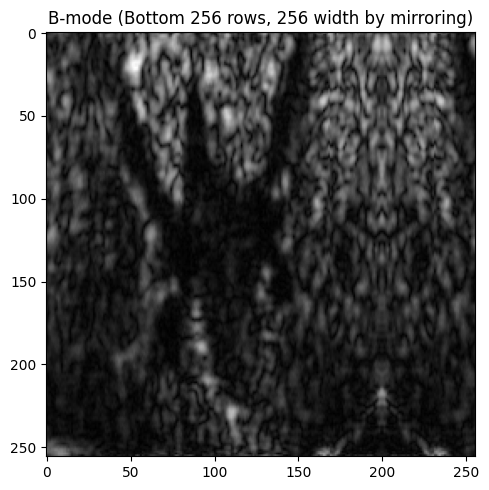

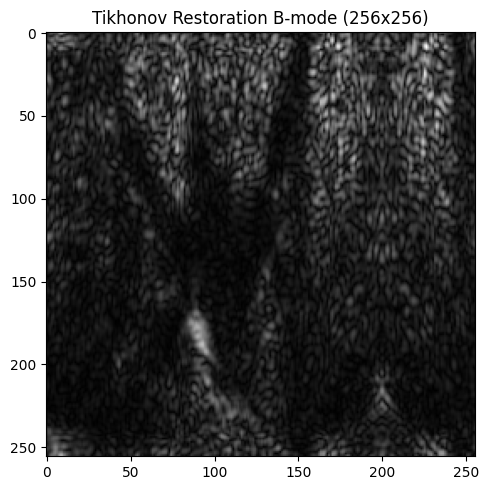

In [38]:
# Re-import necessary packages after code execution state reset
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
from scipy.signal import hilbert

# Reload uploaded files
rf_data = loadmat('exp/datasets/invivo/resized_rf.mat')
psf_data = loadmat('exp/datasets/invivo/psf_estim_vivo.mat')


# Extract RF and PSF with correct key names
rf_resized = rf_data['data'].astype(np.float64)
psf = psf_data['psf_estim_vivo'].astype(np.float64)


# Normalize RF and PSF
rfn = rf_resized / np.max(np.abs(rf_resized))
h = psf / np.sum(np.abs(psf))

# Pad PSF to match RF dimensions and center it
Mh, Nh = h.shape
H, W = rfn.shape
center = np.round(np.array([Mh, Nh]) / 2).astype(int)

pad_h = np.pad(h, ((0, H - Mh), (0, W - Nh)), mode='constant')
pad_h = np.roll(pad_h, 1 - center[0], axis=0)
pad_h = np.roll(pad_h, 1 - center[1], axis=1)

# Tikhonov restoration (Wiener filtering in frequency domain)
D = np.fft.fft2(pad_h)
SNR_val = 1000  # Corresponds to ~20 dB
VivoTK = np.fft.ifft2(np.fft.fft2(rfn) * np.conj(D) / (1/SNR_val + np.conj(D) * D)).real

# Apply Hilbert transform and log compression
LogB = 100
env_tikh = np.abs(hilbert(VivoTK, axis=0))
log_env_tikh = np.log(env_tikh + LogB)

# Step 3: Apply Hilbert transform and log compression
LogB = 100
env = np.abs(hilbert(rf_resized, axis=0))
log_env = np.log(env + LogB)

# Step 4: Visualize the B-mode image
plt.figure(figsize=(5, 5))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('B-mode (Bottom 256 rows, 256 width by mirroring)')
plt.axis('on')
plt.tight_layout()
plt.show()
# Plot restored B-mode image
plt.figure(figsize=(5, 5))
plt.imshow(log_env_tikh, cmap='gray', aspect='auto')
plt.title('Tikhonov Restoration B-mode (256x256)')
plt.axis('on')
plt.tight_layout()
plt.show()

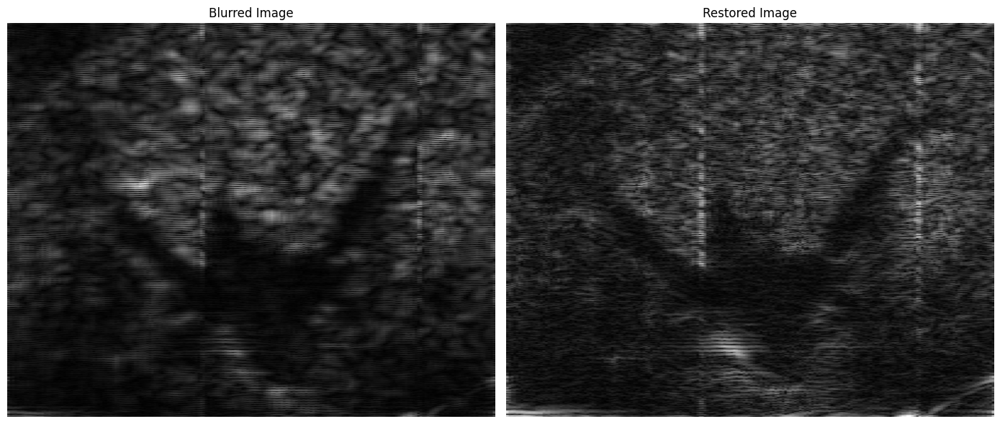

In [9]:
from scipy.io import loadmat
from scipy.signal import hilbert
import numpy as np
import matplotlib.pyplot as plt

# === Paths to RF .mat images ===
folder_name = "512VivoNoDiv_SumDiv60_20it_sigma_20"
image_path_restored = f'exp/image_samples/{folder_name}/0_-1.mat'
image_path_blurred = f'exp/image_samples/{folder_name}/y0_0.mat'

# === Plot RF signals in B-mode style using log envelope ===
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# === Blurred Image ===
try:
    rf_blurred = loadmat(image_path_blurred)['image']
    rf_blurred = np.transpose(rf_blurred, (1, 2, 0))  # Shape: (H, W, C)
    env_blurred = np.abs(hilbert(rf_blurred[0:401, 0:200, 1]))
    bmode_blurred = np.log(env_blurred + 1000)

    axes[0].imshow(bmode_blurred, cmap='gray')
    axes[0].set_title("Blurred Image")
    axes[0].axis('off')
    axes[0].set_aspect('auto')
except Exception as e:
    print("Error loading or processing blurred image:", e)

# === Restored Image ===
try:
    rf_restored = loadmat(image_path_restored)['image']
    rf_restored = np.transpose(rf_restored, (1, 2, 0))  # Shape: (H, W, C)
    env_restored = np.abs(hilbert(rf_restored[0:401, 0:200, 1]))
    bmode_restored = np.log(env_restored + 1000)

    axes[1].imshow(bmode_restored, cmap='gray')
    axes[1].set_title("Restored Image")
    axes[1].axis('off')
    axes[1].set_aspect('auto')
except Exception as e:
    print("Error loading or processing restored image:", e)

plt.tight_layout()
plt.show()


OG


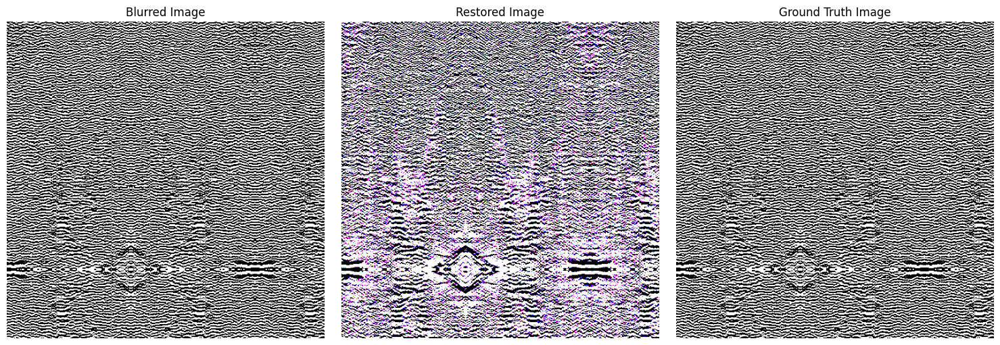

In [10]:
print('OG')
# Specify the paths to your image files
image_path_restored = 'exp/image_samples/'+folder_name+'/0_-1.png'
image_path_GT = 'exp/image_samples/'+folder_name+'/orig_0.png'
image_path_blurred = 'exp/image_samples/'+folder_name+'/y0_0.png'

# Create a figure to hold the images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# List of images and titles
images = [(image_path_blurred, "Blurred Image"),
          (image_path_restored, "Restored Image"),
          (image_path_GT, "Ground Truth Image")]

# Loop through the images and display them
for ax, (image_path, title) in zip(axes, images):
    img = Image.open(image_path)
    ax.imshow(img)
    ax.axis('off')  # Hide axes
    ax.set_title(title)

plt.tight_layout()  # Adjust layout
plt.show()



### Carotid Data

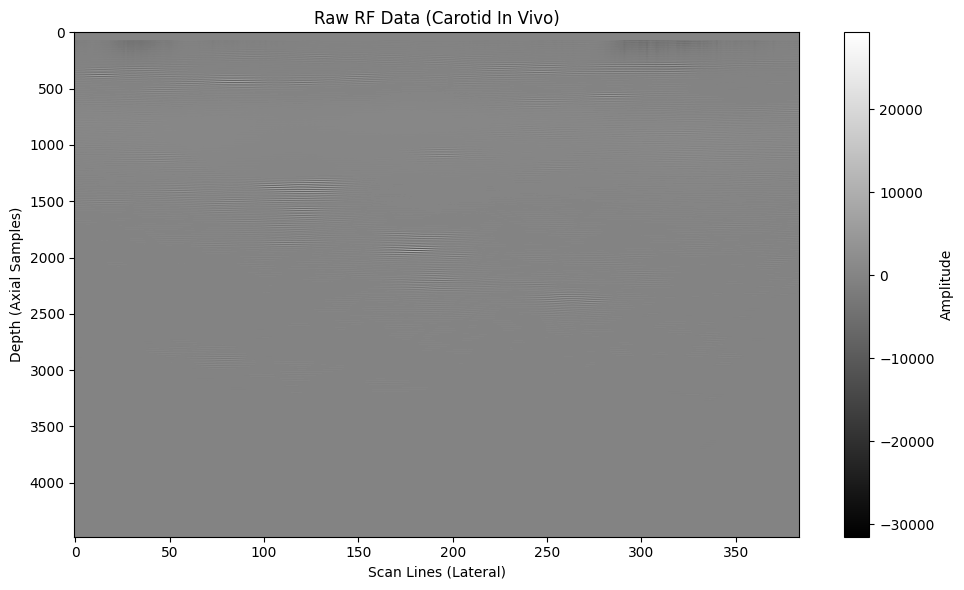

In [5]:
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file
mat = scipy.io.loadmat('exp/datasets/Carotid /rf.mat')
rf = mat['rf']

# Plot the raw RF data
plt.figure(figsize=(10, 6))
plt.imshow(rf, aspect='auto', cmap='gray')
plt.colorbar(label='Amplitude')
plt.title('Raw RF Data (Carotid In Vivo)')
plt.xlabel('Scan Lines (Lateral)')
plt.ylabel('Depth (Axial Samples)')
plt.tight_layout()
plt.show()


In [2]:
rf.shape

(4480, 384)

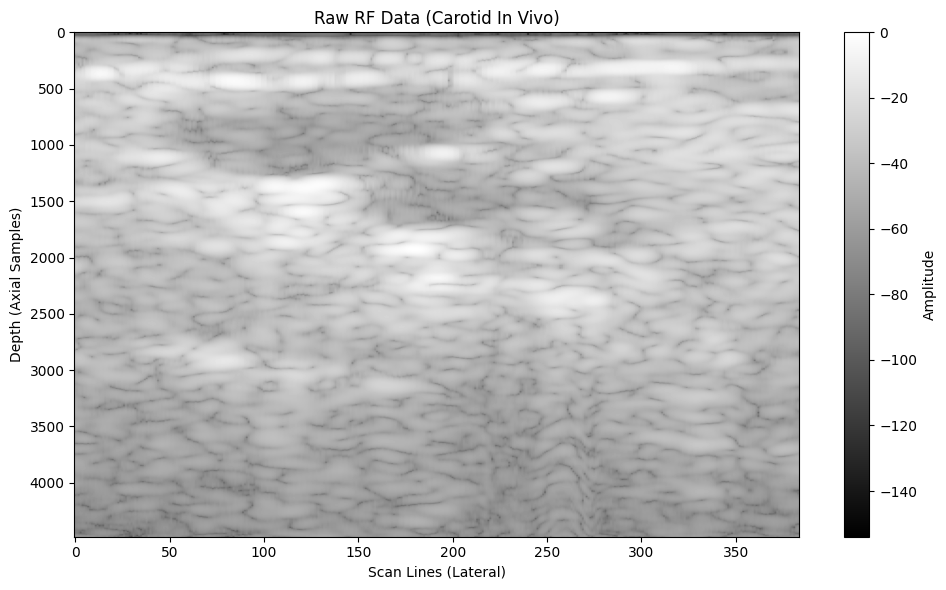

In [6]:
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file
mat = scipy.io.loadmat('exp/datasets/Carotid /bmode.mat')
rf = mat['img']

# Plot the raw RF data
plt.figure(figsize=(10, 6))
plt.imshow(rf, aspect='auto', cmap='gray')
plt.colorbar(label='Amplitude')
plt.title('Raw RF Data (Carotid In Vivo)')
plt.xlabel('Scan Lines (Lateral)')
plt.ylabel('Depth (Axial Samples)')
plt.tight_layout()
plt.show()


In [7]:
rf.shape

(4480, 384)

# Cartoid_bis

In [6]:
import scipy.io
data = scipy.io.loadmat('exp/datasets/carotid/carotid_bis.mat')
print(data.keys())


dict_keys(['__header__', '__version__', '__globals__', 'psf_estimated', 'rf_data', 'xAxis', 'zAxis'])


In [7]:
print(data['rf_data'].shape)

(4480, 384)


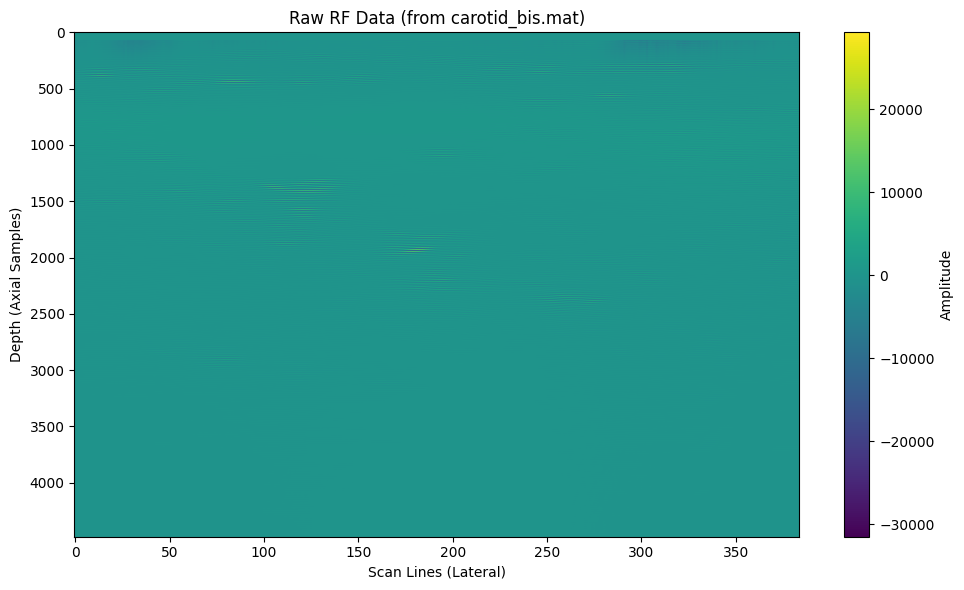

In [9]:
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file
carotid_data = scipy.io.loadmat('exp/datasets/carotid/carotid_bis.mat')

# Extract the RF data
rf_data = carotid_data['rf_data']

# Plot the RF data
plt.figure(figsize=(10, 6))
plt.imshow(rf_data, aspect='auto', cmap='viridis')
plt.colorbar(label='Amplitude')
plt.title('Raw RF Data (from carotid_bis.mat)')
plt.xlabel('Scan Lines (Lateral)')
plt.ylabel('Depth (Axial Samples)')
plt.tight_layout()
plt.show()


In [10]:
import numpy as np
import scipy.io

# Load RF data (already loaded as rf_data)
H, W = rf_data.shape

# Define target crop size
target_h, target_w = 512, 512

# Determine start indices
start_h = max(0, (H - target_h) // 2)
start_w = max(0, (W - target_w) // 2)

# Determine end indices (make sure not to exceed image size)
end_h = min(H, start_h + target_h)
end_w = min(W, start_w + target_w)

# Crop safely
rf_cropped = rf_data[start_h:end_h, start_w:end_w]

# Optionally flip (e.g., vertically)
rf_flipped = np.flipud(rf_cropped)

# Save result
scipy.io.savemat('rf_resized_512.mat', {'GT_rf': rf_flipped})

# Print final shape
print("Final cropped shape:", rf_flipped.shape)


Final cropped shape: (512, 384)


(512, 384)


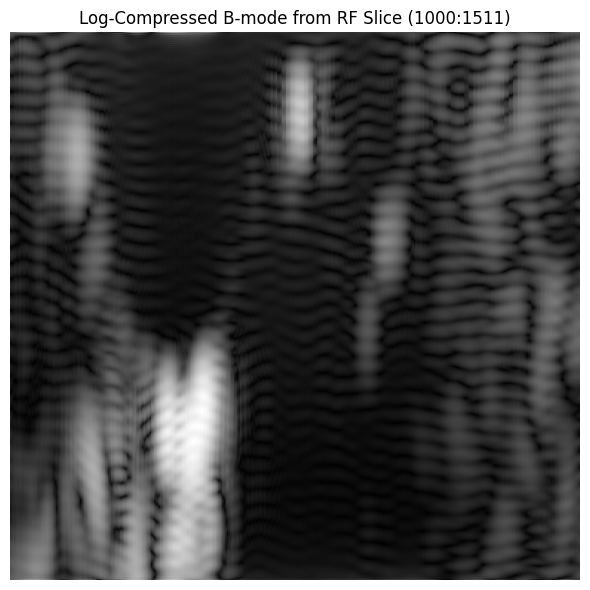

In [11]:
import numpy as np
import scipy.io
from scipy.signal import hilbert
import matplotlib.pyplot as plt

# Load the .mat file
carotid_data = scipy.io.loadmat('exp/datasets/carotid/carotid_bis.mat')
rf_data = carotid_data['rf_data']

# Log compression baseline
LogB = 1000

# Extract 512 rows starting from index 1000
rf_section = rf_data[1000:1000+512, :]

print(rf_section.shape)

# Apply Hilbert transform along depth axis
env = np.abs(hilbert(rf_section, axis=0))

# Log compression
log_env = np.log(env + LogB)

# Plot B-mode image
plt.figure(figsize=(6, 6))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('Log-Compressed B-mode from RF Slice (1000:1511)')
plt.axis('off')
plt.tight_layout()
plt.show()


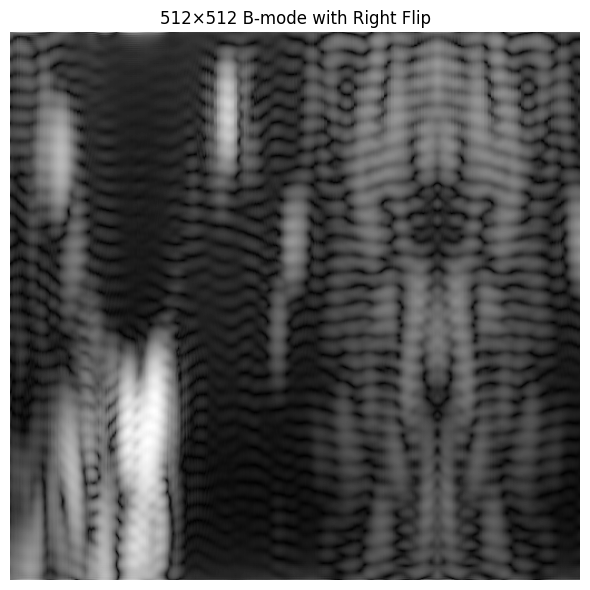

In [12]:
import numpy as np
import scipy.io
from scipy.signal import hilbert
import matplotlib.pyplot as plt

# Load the RF data
carotid_data = scipy.io.loadmat('exp/datasets/carotid/carotid_bis.mat')
rf_data = carotid_data['rf_data']

# Crop a 512×W section from depth 1000
rf_section = rf_data[1000:1000+512, :]  # shape (512, W)
H, W = rf_section.shape

# Step 1: Copy original into new 512×512 matrix
rf_filled = np.zeros((512, 512), dtype=rf_section.dtype)
rf_filled[:, :W] = rf_section

# Step 2: Fill remaining with flipped rightmost part
fill_width = 512 - W
rf_filled[:, W:] = np.fliplr(rf_section[:, -fill_width:])

# Step 3: Hilbert transform + log compression
LogB = 500
env = np.abs(hilbert(rf_filled, axis=0))
log_env = np.log(env + LogB)

# Plot the final 512×512 result
plt.figure(figsize=(6, 6))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('512×512 B-mode with Right Flip')
plt.axis('off')
plt.tight_layout()
plt.show()


In [51]:
import numpy as np
import scipy.io

# (Assuming rf_filled already holds your 512×512 single‐channel RF)
# Normalize to [−1, 1] (optional, depending on whether ToTensor + rescale will handle it later)
rf_norm = rf_filled.astype(np.float32)
rf_min, rf_max = rf_norm.min(), rf_norm.max()
rf_norm = 2 * (rf_norm - rf_min) / (rf_max - rf_min + 1e-8) - 1

# SAVE AS 2D array under the key 'data'
scipy.io.savemat(
    "exp/datasets/carotid/rf_bis.mat",
    {"data": rf_norm}
)



In [52]:
rf_norm.shape

(512, 512)

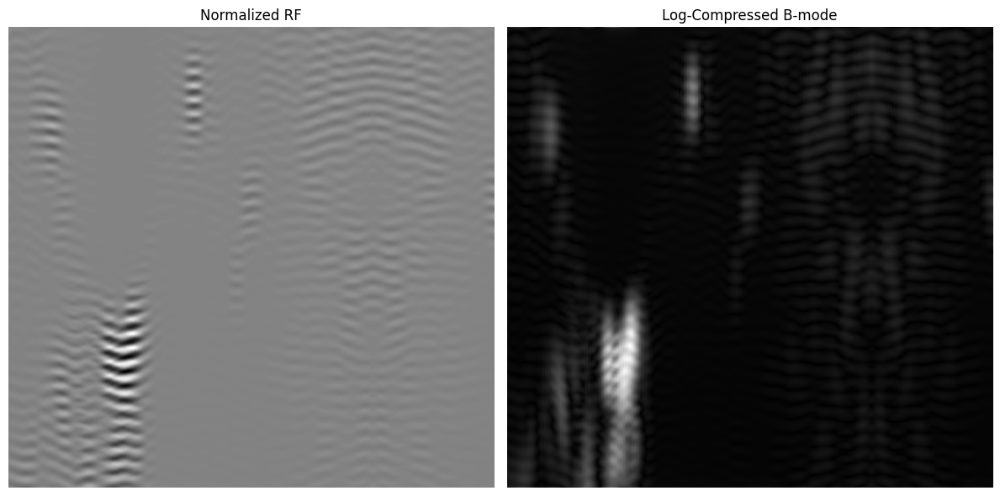

In [61]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# === Load RF data ===
mat = scipy.io.loadmat("exp/datasets/carotid/rf_bis.mat")
rf = mat['data']  # Should be (512, 512)

# === Compute B-mode from RF ===
env = np.abs(hilbert(rf, axis=0))
logB = 1000  # Log compression baseline
bmode = np.log(env + logB)

# === Plot RF and B-mode side by side ===
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(rf, cmap='gray', aspect='auto')
plt.title("Normalized RF")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title("Log-Compressed B-mode")
plt.axis('off')

plt.tight_layout()
plt.show()


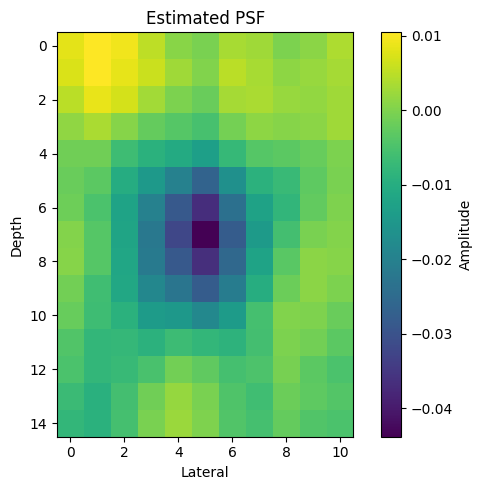

In [77]:
# === Load RF data ===
mat = scipy.io.loadmat("exp/datasets/carotid/psf.mat")
rf = mat['psf']  # Should be (512, 512)
# Plot the estimated PSF
plt.figure(figsize=(6, 5))
plt.imshow(rf, cmap='viridis')
plt.colorbar(label='Amplitude')
plt.title('Estimated PSF')
plt.xlabel('Lateral')
plt.ylabel('Depth')
plt.tight_layout()
plt.show()

In [14]:
psf_estimated.shape

(1001, 1001)

In [74]:
# Perform center cropping of the PSF from [440:580, 440:580]
psf_cropped = psf_estimated[40:60, 55:75]

# Plot the cropped PSF
plt.figure(figsize=(5, 5))
plt.imshow(psf_cropped, cmap='viridis')
plt.colorbar(label='Amplitude')
plt.title('Cropped PSF for DDRM (440:580)')
plt.xlabel('Lateral')
plt.ylabel('Depth')
plt.tight_layout()
plt.show()

# Display shape to confirm crop
psf_cropped.shape


NameError: name 'psf_estimated' is not defined

In [50]:
# Save to psf_ref.mat
scipy.io.savemat('psf_carotid.mat', {'psf_ref': psf_cropped})

In [30]:
import scipy.io, torch, os
root = "/projects/minds/PDAS-M2-2025/Stable_DDRM/exp/datasets/carotid"
print(os.path.isfile(os.path.join(root, "rf_bis.mat")))
print(os.path.isfile(os.path.join(root, "psf_carotid.mat")))
data = scipy.io.loadmat(os.path.join(root, "rf_bis.mat"))
print(data.keys())           # should contain 'data'


True
True
dict_keys(['__header__', '__version__', '__globals__', 'data'])


In [11]:
folder_name = "carotid_bis"

In [21]:
!python main.py \
  --ni \
  --config Carotid_bis.yml \
  --doc carotid \
  --timesteps 20 --eta 0.85 --etaB 1 \
  --deg deblur_bccb --sigma_0 20 \
  -i {folder_name}


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-06-04 11:16:16,525 - Using device: cuda
INFO - main.py - 2025-06-04 11:16:16,526 - Writing log file to exp/logs/carotid
INFO - main.py - 2025-06-04 11:16:16,526 - Exp instance id = 2705922
INFO - main.py - 2025-06-04 11:16:16,526 - Exp comment = 
Start from 0
  0%|                                                     | 0/1 [00:00<?, ?it/s]tensor(0.9634, device='cuda:0')
tensor(-1., dev

In [32]:
# ── file: datasets/carotid_mat.py ───────────────────────────────────────────────

import os
import numpy as np
import torch
import scipy.io as sio
from torch.utils.data import Dataset

# 1) Read the RF slice
loaded = sio.loadmat(os.path.join(root, "carotid_data.mat"))
mat = loaded["GT_rf"].astype(np.float32)  # shape: (H, W)

      

In [33]:
# 2) Normalize to ±1 (model expects inputs in [–1,1] if it was trained that way)
mat /= (np.max(np.abs(mat)) + 1e-8)


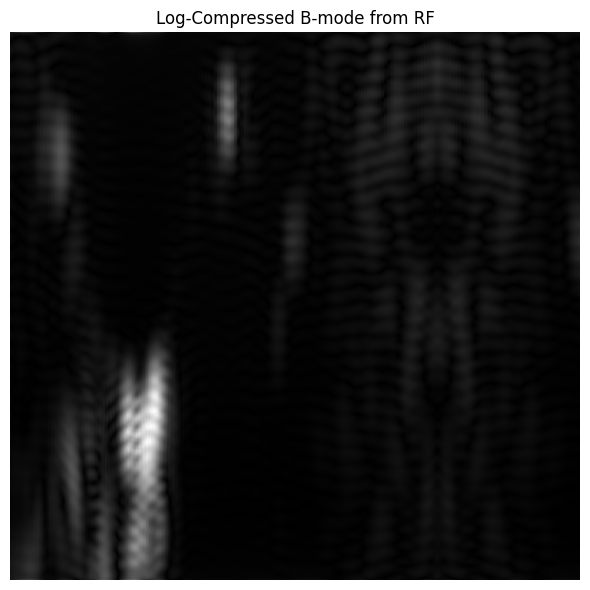

In [34]:
# Create log-compressed B-mode image
logB = 1000
env = np.abs(hilbert(mat, axis=0))
bmode_log = np.log(env + logB)

# Plot B-mode from RF
plt.figure(figsize=(6, 6))
plt.imshow(bmode_log, cmap='gray', aspect='auto')
plt.title('Log-Compressed B-mode from RF')
plt.axis('off')
plt.tight_layout()
plt.show()


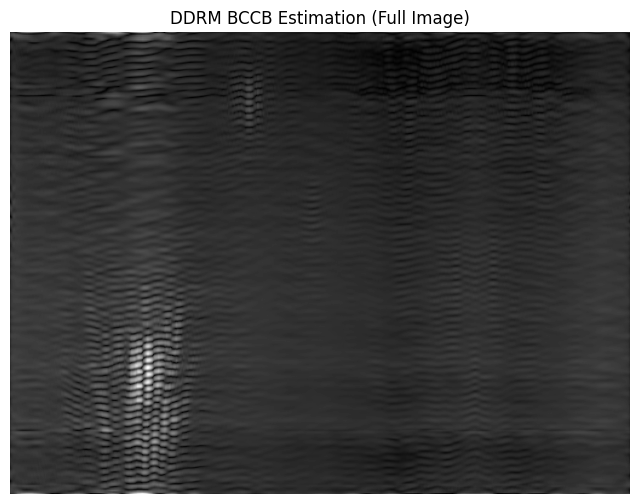

In [35]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# 1) Load the DDRM output (.mat) and extract 'image'
mat = scipy.io.loadmat('exp/image_samples/Carotid/0_-1.mat')
image = mat['image']  # shape is (C, H, W)

# 2) Permute from (C, H, W) → (H, W, C):
image = np.transpose(image, (1, 2, 0))

# 3) Convert to grayscale by averaging over channels:
grayimage = np.mean(image, axis=2)  # shape is (H, W)

# 4) Compute the Hilbert envelope along each column (axis=0):
analytic = hilbert(grayimage, axis=0)
envelope = np.abs(analytic)

# 5) Apply log compression with LogB = 1000:
LogB = 1000
bmode = np.log(envelope + LogB)

# 6) Display as a B-mode image:
plt.figure(figsize=(8, 6))
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title('DDRM BCCB Estimation (Full Image)')
plt.axis('off')
plt.show()



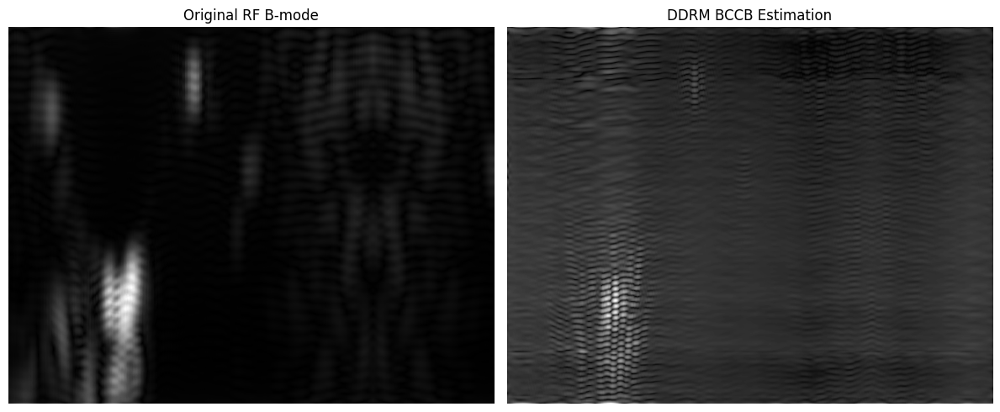

In [36]:
# Plot side-by-side (both same, for now)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_log, cmap='gray', aspect='auto')
plt.title("Original RF B-mode")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title("DDRM BCCB Estimation")
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
folder_name = "carotid_bis"

In [86]:
!python main.py \
  --ni \
  --config Carotid_bis.yml \
  --doc imagenet_ood \
  --timesteps 20 \
  --eta 0.85 --etaB 1 \
  --deg deblur_bccb --sigma_0 20 \
  -i carotid_bis


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-06-05 11:34:03,843 - Using device: cuda
INFO - main.py - 2025-06-05 11:34:03,844 - Writing log file to exp/logs/imagenet_ood
INFO - main.py - 2025-06-05 11:34:03,844 - Exp instance id = 2744868
INFO - main.py - 2025-06-05 11:34:03,845 - Exp comment = 
building dataset from exp/carotid_bis.txt
read meta done
Start from 0
  0%|                                                     | 0/1 [

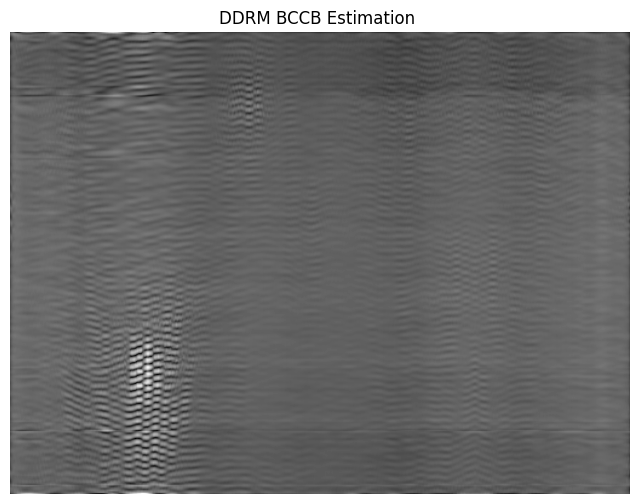

In [87]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# 1) Load the DDRM output (.mat) and extract 'image'
mat = scipy.io.loadmat('exp/image_samples/carotid_bis/0_-1.mat')
image = mat['image']  # shape is (C, H, W)

# 2) Permute from (C, H, W) → (H, W, C):
image = np.transpose(image, (1, 2, 0))

# 3) Convert to grayscale by averaging over channels:
grayimage = np.mean(image, axis=2)  # shape is (H, W)

# 4) Compute the Hilbert envelope along each column (axis=0):
analytic = hilbert(grayimage, axis=0)
envelope = np.abs(analytic)

# 5) Apply log compression with LogB = 1000:
LogB = 1000
bmode = np.log(envelope + LogB)

# 6) Display as a B-mode image:
plt.figure(figsize=(8, 6))
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title('DDRM BCCB Estimation ')
plt.axis('off')
plt.show()


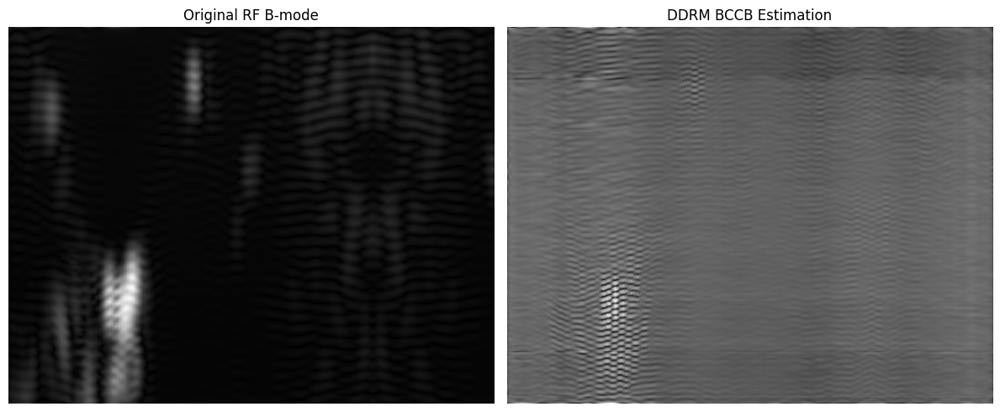

In [88]:
# 1) Load the DDRM output (.mat) and extract 'image'
mat = scipy.io.loadmat('exp/image_samples/carotid_bis/0_-1.mat')
image = mat['image']  # shape is (C, H, W)

# 2) Permute from (C, H, W) → (H, W, C):
image = np.transpose(image, (1, 2, 0))

# 3) Convert to grayscale by averaging over channels:
grayimage = np.mean(image, axis=2)  # shape is (H, W)

# 4) Compute the Hilbert envelope along each column (axis=0):
analytic = hilbert(grayimage, axis=0)
envelope = np.abs(analytic)

# 5) Apply log compression with LogB = 1000:
LogB = 1000
bmode = np.log(envelope + LogB)

# === Load RF data ===
mat = scipy.io.loadmat("exp/datasets/carotid/rf_bis.mat")
rf = mat['data']  # Should be (512, 512)

# === Compute B-mode from RF ===
env = np.abs(hilbert(rf, axis=0))
logB = 1000  # Log compression baseline
bmode_vivo = np.log(env + logB)

# Plot side-by-side (both same, for now)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Original RF B-mode")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title("DDRM BCCB Estimation")
plt.axis('off')

plt.tight_layout()
plt.show()

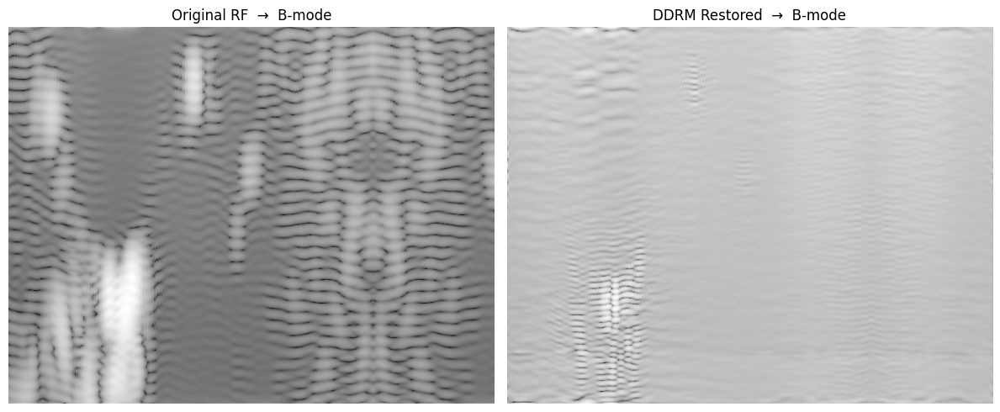

In [79]:
import scipy.io, numpy as np, matplotlib.pyplot as plt
from scipy.signal import hilbert

def rf_to_bmode(rf2d, clip_db=-60):
    env  = np.abs(hilbert(rf2d, axis=0))
    log  = 20*np.log10(env + 1e-6)
    log  = np.clip(log, clip_db, None)
    log -= log.min()
    log /= (log.max() + 1e-8)
    return log

# Restore
rest = scipy.io.loadmat('exp/image_samples/carotid_bis/0_-1.mat')['image']
rest = rest.transpose(1,2,0)[:,:,0]        # (H,W)
bmode_rest = rf_to_bmode(rest)

# Original
rf = scipy.io.loadmat('exp/datasets/carotid/rf_bis.mat')['data']  # (512,512)
bmode_orig = rf_to_bmode(rf)

# Plot
plt.figure(figsize=(12,5))
plt.subplot(1,2,1); plt.imshow(bmode_orig, cmap='gray', aspect='auto'); plt.title('Original RF  →  B-mode'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(bmode_rest, cmap='gray', aspect='auto'); plt.title('DDRM Restored  →  B-mode'); plt.axis('off')
plt.tight_layout(); plt.show()


In [2]:
import scipy.io
data = scipy.io.loadmat('exp/datasets/NewVivoData/newData.mat')
print(data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'matImage'])


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
import scipy.io

# Load the data
data = scipy.io.loadmat('exp/datasets/NewVivoData/newData.mat')
rf = data['matImage'].astype(np.float64)
print('RF shape:', rf.shape)
print('RF range: min =', np.min(rf), ', max =', np.max(rf))


RF shape: (832, 299)
RF range: min = -8192.0 , max = 5741.0


In [3]:
mat = data['matImage']
print(type(mat))
print(mat.shape)
print(mat.dtype)


<class 'numpy.ndarray'>
(832, 299)
int16


In [16]:
import scipy.io
import numpy as np

# Load the original RF data
data = scipy.io.loadmat('exp/datasets/NewVivoData/newData.mat')
rf = data['matImage'].astype(np.float64)

# Normalize to [0, 1]
rf_min = rf.min()
rf_max = rf.max()
rf_norm = (rf - rf_min) / (rf_max - rf_min + 1e-12)

# Save normalized RF to .mat file
scipy.io.savemat('exp/datasets/NewVivoData/rf_normalized.mat', {'rf_norm': rf_norm})

# Return confirmation and stats
rf_norm.shape, rf_norm.min(), rf_norm.max()


((832, 299), 0.0, 0.9999999999999999)

In [22]:
import numpy as np
import scipy.io

# Load the original RF data
data = scipy.io.loadmat('exp/datasets/NewVivoData/newData.mat')
rf = data['matImage'].astype(np.float64)

# Normalize to [-1, 1]
rf_min = rf.min()
rf_max = rf.max()
rf_norm = 2 * (rf - rf_min) / (rf_max - rf_min + 1e-12) - 1

# Save normalized RF to .mat file
scipy.io.savemat('exp/datasets/NewVivoData/rf_normalized.mat', {'data': rf_norm})


# Return confirmation and stats
rf_norm.shape, rf_norm.min(), rf_norm.max()


((832, 299), -1.0, 0.9999999999999998)

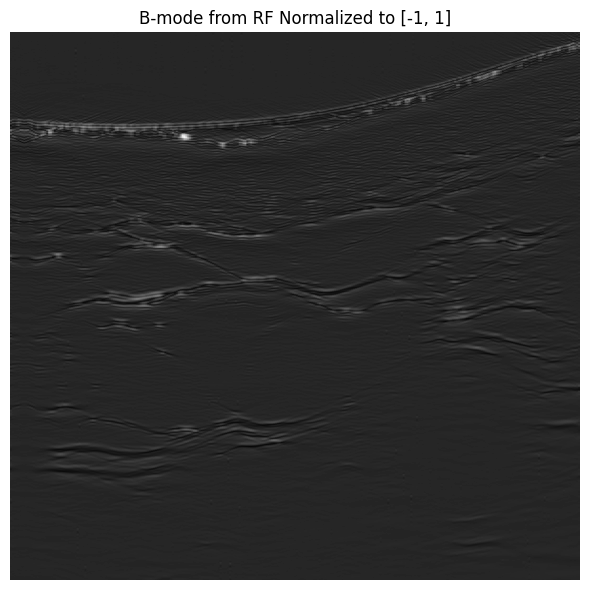

In [23]:
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Envelope detection using Hilbert transform
env_norm = np.abs(hilbert(rf_norm, axis=0))

# Log compression
logB = 100
bmode_norm = np.log(env_norm + logB)

# Display the normalized B-mode image
plt.figure(figsize=(6, 6))
plt.imshow(bmode_norm, cmap='gray', aspect='auto')
plt.title('B-mode from RF Normalized to [-1, 1]')
plt.axis('off')
plt.tight_layout()
plt.show()


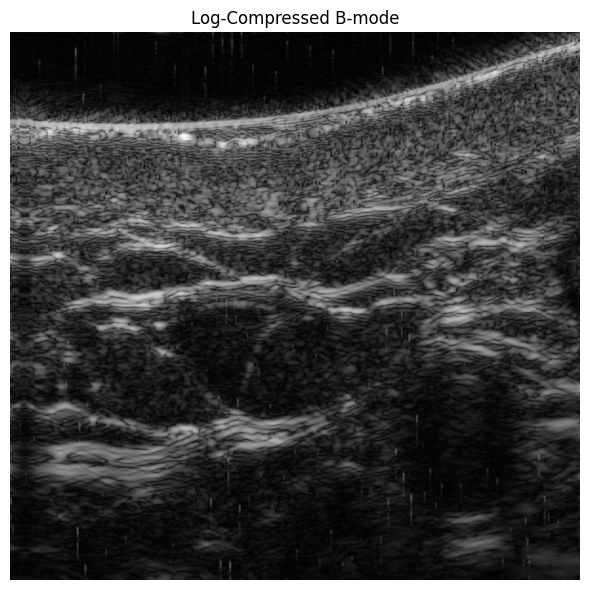

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Envelope detection
env = np.abs(hilbert(mat, axis=0))

# Log compression
logB = 100  # adjust as needed
bmode_log = np.log(env + logB)

# Display B-mode image
plt.figure(figsize=(6, 6))
plt.imshow(bmode_log, cmap='gray', aspect='auto')
plt.title('Log-Compressed B-mode')
plt.axis('off')
plt.tight_layout()
plt.show()


(512, 299)


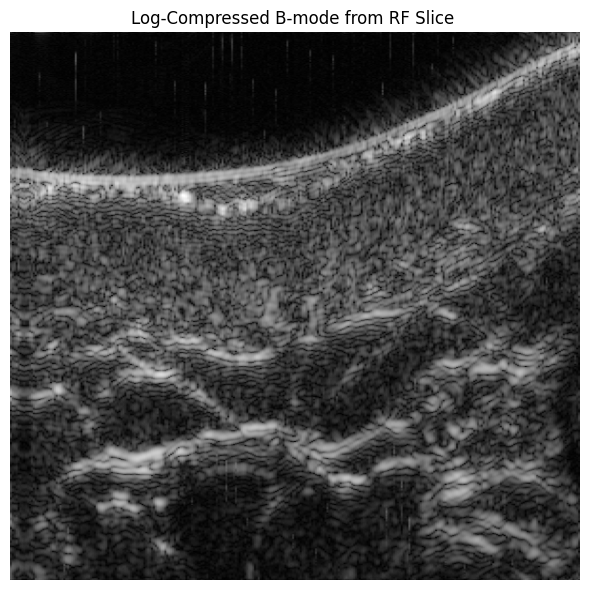

In [25]:
import numpy as np
import scipy.io
from scipy.signal import hilbert
import matplotlib.pyplot as plt

# Load the .mat file
carotid_data = scipy.io.loadmat('exp/datasets/NewVivoData/newData.mat')
rf_data = carotid_data['matImage']

# Log compression baseline
LogB = 100

# Extract 512 rows starting from index 1000
rf_section = rf_data[5:5+512, :]

print(rf_section.shape)

# Apply Hilbert transform along depth axis
env = np.abs(hilbert(rf_section, axis=0))

# Log compression
log_env = np.log(env + LogB)

# Plot B-mode image
plt.figure(figsize=(6, 6))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('Log-Compressed B-mode from RF Slice ')
plt.axis('off')
plt.tight_layout()
plt.show()


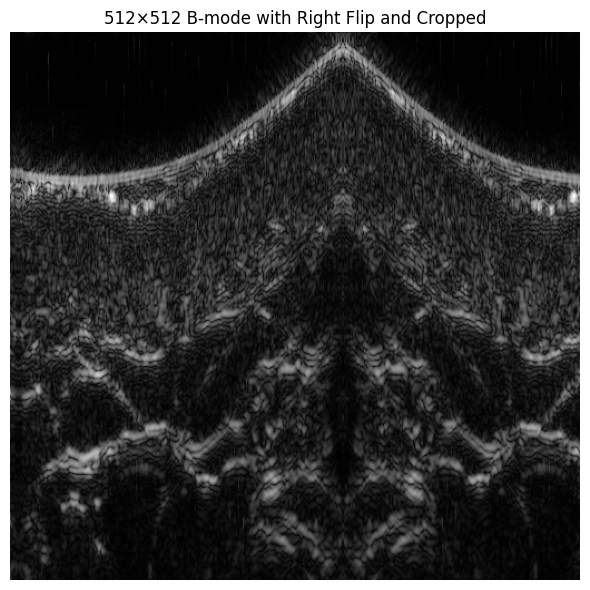

In [26]:
H, W = rf_section.shape

# Step 1: Copy original into new 512×512 matrix
rf_filled = np.zeros((512, 512), dtype=rf_section.dtype)
rf_filled[:, :W] = rf_section

# Step 2: Fill remaining with flipped rightmost part
fill_width = 512 - W
rf_filled[:, W:] = np.fliplr(rf_section[:, -fill_width:])

# Step 3: Hilbert transform + log compression
LogB = 500
env = np.abs(hilbert(rf_filled, axis=0))
log_env = np.log(env + LogB)

# Plot the final 512×512 result
plt.figure(figsize=(6, 6))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('512×512 B-mode with Right Flip and Cropped')
plt.axis('off')
plt.tight_layout()
plt.show()


In [27]:
rf_filled.shape

(512, 512)

In [29]:
import scipy.io

# Save only the 512×512 RF matrix
scipy.io.savemat('exp/datasets/NewVivoData/rf_ddrm.mat', {'rf': rf_filled})


In [34]:
# Load the estimated PSF from the uploaded psf.mat file
psf_mat_path = 'exp/datasets/NewVivoData/PSF_crop.mat'
psf_data = scipy.io.loadmat(psf_mat_path)

# List keys to identify the PSF variable
psf_data.keys()


dict_keys(['__header__', '__version__', '__globals__', 'Nx', 'Nz', 'center', 'col', 'crop_size', 'cropped_psf', 'data', 'linear_idx', 'max_cropped_val', 'max_val', 'ncf', 'psf_full', 'rf', 'row'])

PSF shape: (31, 31)
PSF max value: 0.0007860888220883653


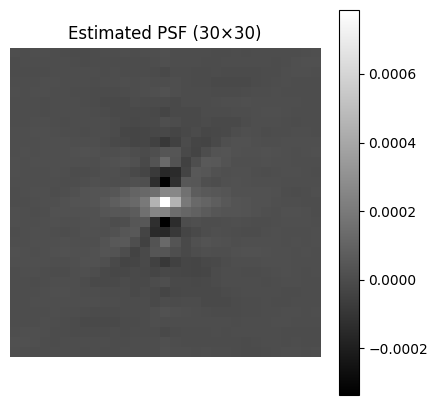

In [35]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt

# Load the PSF .mat file
psf_mat_path = 'exp/datasets/NewVivoData/PSF_crop.mat'
psf_data = scipy.io.loadmat(psf_mat_path)

# Extract the PSF
psf = psf_data['cropped_psf']

# Check its shape and statistics
print("PSF shape:", psf.shape)
print("PSF max value:", np.max(np.abs(psf)))

# Visualize
plt.figure(figsize=(5, 5))
plt.imshow(psf, cmap='gray')
plt.title('Estimated PSF (30×30)')
plt.axis('off')
plt.colorbar()
plt.show()


In [36]:
import scipy.io

# Load the uploaded rf data
rf_mat_path = 'exp/datasets/NewVivoData/rf_ddrm.mat'
rf_data = scipy.io.loadmat(rf_mat_path)

# Show available keys to determine variable name
rf_data.keys()


dict_keys(['__header__', '__version__', '__globals__', 'rf'])

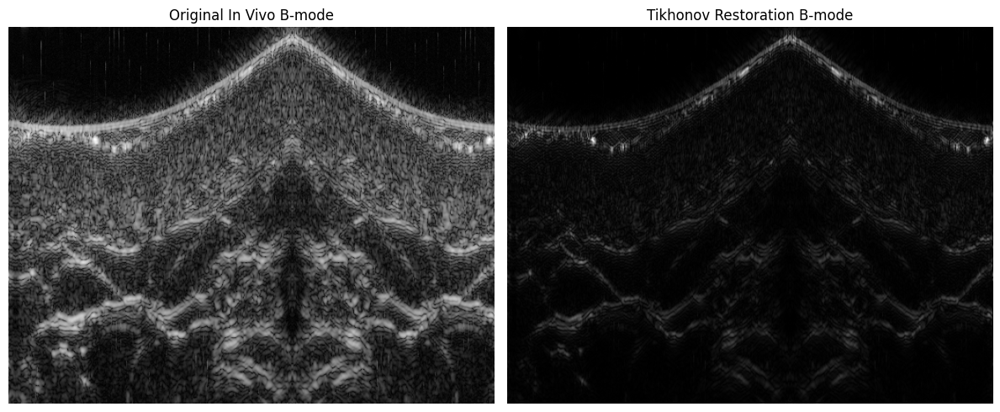

In [13]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Load PSF and RF data
psf_data = scipy.io.loadmat('exp/datasets/NewVivoData/psf.mat')
psf = psf_data['psf']
psf = psf / np.sum(np.abs(psf))

rf_mat = scipy.io.loadmat('exp/datasets/NewVivoData/rf_for_psf.mat')
data = rf_mat['rf'].astype(np.float64)

# Create D matrix as BCCB via FFT of padded PSF
Mh, Nh = psf.shape
# Pad PSF to match data size
pad_z = data.shape[0] - Mh
pad_x = data.shape[1] - Nh
pad_psf = np.pad(psf, ((0, pad_z), (0, pad_x)), mode='constant')
# Compute shift to center PSF
center = np.round(np.array([Mh, Nh]) / 2).astype(int) - 1
# Perform circshift equivalent
psf_shifted = np.roll(np.roll(pad_psf, -center[0], axis=0), -center[1], axis=1)
D = np.fft.fft2(psf_shifted)

# Tikhonov Deconvolution
SNR = 100
rfn = data / np.max(np.abs(data))
RF = np.fft.fft2(rfn)
VivoTK = np.fft.ifft2(RF * np.conj(D) / ( (1/SNR) + (np.conj(D) * D) ), s=data.shape).real

# Compute B-mode images
LogB = 100
orig_env = np.abs(hilbert(data, axis=0))
orig_bmode = np.log(orig_env + LogB)
tk_env = np.abs(hilbert(VivoTK, axis=0))
tk_bmode = np.log(tk_env + LogB)

# Display results side by side
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(orig_bmode, cmap='gray', aspect='auto')
plt.title('Original In Vivo B-mode')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(tk_bmode, cmap='gray', aspect='auto')
plt.title('Tikhonov Restoration B-mode')
plt.axis('off')

plt.tight_layout()
plt.show()


In [14]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert, wiener
from scipy.optimize import minimize_scalar
from scipy.ndimage import gaussian_filter

# Load PSF and RF data
psf_data = scipy.io.loadmat('exp/datasets/NewVivoData/psf.mat')
psf = psf_data['psf']
psf = psf / np.sum(np.abs(psf))

rf_mat = scipy.io.loadmat('exp/datasets/NewVivoData/rf_for_psf.mat')
data = rf_mat['data'].astype(np.float64)

# Normalize data
rfn = data / np.max(np.abs(data))

# Create D matrix as BCCB via FFT of padded PSF
Mh, Nh = psf.shape
pad_z = data.shape[0] - Mh
pad_x = data.shape[1] - Nh
pad_psf = np.pad(psf, ((0, pad_z), (0, pad_x)), mode='constant')

# Compute shift to center PSF
center = np.round(np.array([Mh, Nh]) / 2).astype(int) - 1
psf_shifted = np.roll(np.roll(pad_psf, -center[0], axis=0), -center[1], axis=1)
D = np.fft.fft2(psf_shifted)

# Method 1: Improved Tikhonov with adaptive regularization
def adaptive_tikhonov(RF, D, noise_level=0.01):
    """Adaptive Tikhonov regularization based on local noise estimation"""
    # Estimate noise variance from high-frequency components
    noise_var = np.var(np.abs(RF)) * noise_level
    
    # Adaptive regularization parameter
    alpha = noise_var / (np.mean(np.abs(D)**2) + 1e-10)
    
    # Tikhonov filter
    H = np.conj(D) / (np.abs(D)**2 + alpha)
    return np.fft.ifft2(RF * H).real

# Method 2: Iterative Wiener filtering
def iterative_wiener(RF, D, iterations=5, SNR=50):
    """Iterative Wiener filtering for better restoration"""
    result = np.fft.ifft2(RF).real
    
    for i in range(iterations):
        # Forward model
        result_fft = np.fft.fft2(result)
        
        # Wiener filter
        H = np.conj(D) / (np.abs(D)**2 + 1/SNR)
        result = np.fft.ifft2(RF * H).real
        
        # Apply soft thresholding to reduce noise
        threshold = np.std(result) * 0.1
        result = np.sign(result) * np.maximum(np.abs(result) - threshold, 0)
    
    return result

# Method 3: Lucy-Richardson deconvolution
def lucy_richardson(RF, D, iterations=10):
    """Lucy-Richardson deconvolution for non-negative restoration"""
    # Initialize with simple inverse filter
    H_init = np.conj(D) / (np.abs(D)**2 + 0.01)
    estimate = np.abs(np.fft.ifft2(RF * H_init))
    
    D_conj = np.conj(D)
    
    for i in range(iterations):
        # Forward model
        convolved = np.fft.ifft2(np.fft.fft2(estimate) * D).real
        
        # Ratio
        ratio = np.fft.fft2(np.fft.ifft2(RF).real / (convolved + 1e-10))
        
        # Update estimate
        correction = np.fft.ifft2(ratio * D_conj).real
        estimate = estimate * np.abs(correction)
        
        # Ensure positivity
        estimate = np.maximum(estimate, 0)
    
    return estimate

# Method 4: Total Variation regularized deconvolution
def tv_deconvolution(RF, D, alpha=0.1, iterations=20):
    """Total Variation regularized deconvolution"""
    # Initialize
    result = np.fft.ifft2(RF * np.conj(D) / (np.abs(D)**2 + 0.1)).real
    
    for i in range(iterations):
        # Data fidelity term
        residual = np.fft.ifft2(RF - np.fft.fft2(result) * D).real
        data_term = np.fft.ifft2(np.fft.fft2(residual) * np.conj(D)).real
        
        # TV regularization term (simplified gradient descent)
        grad_x = np.gradient(result, axis=1)
        grad_z = np.gradient(result, axis=0)
        
        # TV gradient
        div_x = np.gradient(grad_x / (np.sqrt(grad_x**2 + grad_z**2) + 1e-8), axis=1)
        div_z = np.gradient(grad_z / (np.sqrt(grad_x**2 + grad_z**2) + 1e-8), axis=0)
        tv_term = div_x + div_z
        
        # Update
        step_size = 0.01
        result = result + step_size * (data_term + alpha * tv_term)
    
    return result

# Method 5: Spectral regularization
def spectral_regularization(RF, D, cutoff_freq=0.8):
    """Spectral regularization with frequency domain filtering"""
    # Create frequency grid
    M, N = RF.shape
    u = np.fft.fftfreq(M)
    v = np.fft.fftfreq(N)
    U, V = np.meshgrid(v, u)
    
    # Spectral filter (Butterworth-like)
    freq_radius = np.sqrt(U**2 + V**2)
    spectral_filter = 1 / (1 + (freq_radius / cutoff_freq)**8)
    
    # Combined filter
    H = (np.conj(D) / (np.abs(D)**2 + 0.01)) * spectral_filter
    
    return np.fft.ifft2(RF * H).real

# Apply all methods
RF = np.fft.fft2(rfn)

print("Applying deconvolution methods...")
adaptive_tk = adaptive_tikhonov(RF, D)
iterative_wien = iterative_wiener(RF, D)
lucy_rich = lucy_richardson(RF, D)
tv_deconv = tv_deconvolution(RF, D)
spectral_reg = spectral_regularization(RF, D)

# Original Tikhonov for comparison
SNR = 100
original_tk = np.fft.ifft2(RF * np.conj(D) / ((1/SNR) + (np.conj(D) * D))).real

# Function to compute B-mode
def compute_bmode(rf_data, log_offset=100):
    env = np.abs(hilbert(rf_data, axis=0))
    return np.log(env + log_offset)

# Compute B-mode images
methods = {
    'Original': data,
    'Standard Tikhonov': original_tk,
    'Adaptive Tikhonov': adaptive_tk,
    'Iterative Wiener': iterative_wien,
    'Lucy-Richardson': lucy_rich,
    'TV Regularized': tv_deconv,
    'Spectral Regularized': spectral_reg
}

bmode_images = {}
for name, rf_data in methods.items():
    bmode_images[name] = compute_bmode(rf_data)

# Display results
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (name, bmode) in enumerate(bmode_images.items()):
    if i < len(axes):
        axes[i].imshow(bmode, cmap='gray', aspect='auto')
        axes[i].set_title(f'{name}')
        axes[i].axis('off')

# Remove empty subplot
if len(bmode_images) < len(axes):
    axes[-1].remove()

plt.tight_layout()
plt.show()

# Quantitative metrics
def compute_metrics(original, restored):
    """Compute image quality metrics"""
    # Peak Signal-to-Noise Ratio
    mse = np.mean((original - restored)**2)
    max_val = np.max(original)
    psnr = 20 * np.log10(max_val / np.sqrt(mse)) if mse > 0 else float('inf')
    
    # Contrast-to-Noise Ratio (simplified)
    signal_var = np.var(restored)
    noise_var = np.var(original - restored)
    cnr = signal_var / (noise_var + 1e-10)
    
    # Structural Similarity (simplified)
    mean_orig = np.mean(original)
    mean_rest = np.mean(restored)
    cov = np.mean((original - mean_orig) * (restored - mean_rest))
    var_orig = np.var(original)
    var_rest = np.var(restored)
    ssim = (2 * mean_orig * mean_rest + 1e-10) * (2 * cov + 1e-10) / \
           ((mean_orig**2 + mean_rest**2 + 1e-10) * (var_orig + var_rest + 1e-10))
    
    return psnr, cnr, ssim

# Print metrics
print("\nQuantitative Metrics:")
print("Method\t\t\tPSNR\t\tCNR\t\tSSIM")
print("-" * 50)

orig_bmode = bmode_images['Original']
for name, bmode in bmode_images.items():
    if name != 'Original':
        psnr, cnr, ssim = compute_metrics(orig_bmode, bmode)
        print(f"{name:<20}\t{psnr:.2f}\t\t{cnr:.2f}\t\t{ssim:.3f}")

# Additional enhancement: Compound method
print("\nApplying compound enhancement...")
# Combine best aspects of different methods
compound = 0.4 * adaptive_tk + 0.3 * iterative_wien + 0.3 * spectral_reg
compound_bmode = compute_bmode(compound)

# Display compound result
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(bmode_images['Original'], cmap='gray', aspect='auto')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bmode_images['Adaptive Tikhonov'], cmap='gray', aspect='auto')
plt.title('Best Single Method')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(compound_bmode, cmap='gray', aspect='auto')
plt.title('Compound Enhancement')
plt.axis('off')

plt.tight_layout()
plt.show()

# Parameter optimization example
def optimize_tikhonov():
    """Optimize Tikhonov regularization parameter"""
    def objective(log_alpha):
        alpha = 10**log_alpha
        H = np.conj(D) / (np.abs(D)**2 + alpha)
        restored = np.fft.ifft2(RF * H).real
        
        # Minimize residual while maintaining smoothness
        residual = np.fft.ifft2(RF - np.fft.fft2(restored) * D)
        residual_norm = np.sum(np.abs(residual)**2)
        
        # Regularization term
        grad_x = np.gradient(restored, axis=1)
        grad_z = np.gradient(restored, axis=0)
        smoothness = np.sum(grad_x**2 + grad_z**2)
        
        return residual_norm + 0.1 * smoothness
    
    result = minimize_scalar(objective, bounds=(-4, 0), method='bounded')
    optimal_alpha = 10**result.x
    
    print(f"Optimal regularization parameter: {optimal_alpha:.6f}")
    
    # Apply optimal parameters
    H_opt = np.conj(D) / (np.abs(D)**2 + optimal_alpha)
    optimal_restored = np.fft.ifft2(RF * H_opt).real
    
    return optimal_restored

# Apply parameter optimization
optimal_result = optimize_tikhonov()
optimal_bmode = compute_bmode(optimal_result)

# Final comparison
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.imshow(bmode_images['Original'], cmap='gray', aspect='auto')
plt.title('Original In Vivo')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(bmode_images['Standard Tikhonov'], cmap='gray', aspect='auto')
plt.title('Standard Tikhonov')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(compound_bmode, cmap='gray', aspect='auto')
plt.title('Compound Enhancement')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(optimal_bmode, cmap='gray', aspect='auto')
plt.title('Optimized Parameters')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Enhancement complete! Try different methods to see which works best for your data.")

KeyError: 'data'

In [37]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from scipy.optimize import minimize_scalar

# Load PSF and RF data
psf_data = scipy.io.loadmat('exp/datasets/NewVivoData/PSF_crop.mat')
psf = psf_data['psf']
psf = psf / np.sum(np.abs(psf))

rf_mat = scipy.io.loadmat('exp/datasets/NewVivoData/rf_ddrm.mat')
data = rf_mat['rf'].astype(np.float64)

# Normalize data
rfn = data / np.max(np.abs(data))

# Create D matrix as BCCB via FFT of padded PSF
Mh, Nh = psf.shape
pad_z = data.shape[0] - Mh
pad_x = data.shape[1] - Nh
pad_psf = np.pad(psf, ((0, pad_z), (0, pad_x)), mode='constant')

# Compute shift to center PSF
center = np.round(np.array([Mh, Nh]) / 2).astype(int) - 1
psf_shifted = np.roll(np.roll(pad_psf, -center[0], axis=0), -center[1], axis=1)
D = np.fft.fft2(psf_shifted)

# Improved deconvolution methods with proper contrast handling
def enhanced_tikhonov(RF, D, alpha=0.01, contrast_enhance=True):
    """Enhanced Tikhonov with contrast preservation"""
    # Standard Tikhonov filter
    H = np.conj(D) / (np.abs(D)**2 + alpha)
    restored = np.fft.ifft2(RF * H).real
    
    if contrast_enhance:
        # Preserve energy/contrast
        original_energy = np.sum(np.abs(np.fft.ifft2(RF).real)**2)
        restored_energy = np.sum(np.abs(restored)**2)
        energy_ratio = np.sqrt(original_energy / (restored_energy + 1e-10))
        restored = restored * energy_ratio
        
        # Adaptive contrast enhancement
        original_rf = np.fft.ifft2(RF).real
        orig_std = np.std(original_rf)
        rest_std = np.std(restored)
        contrast_ratio = orig_std / (rest_std + 1e-10)
        restored = restored * min(contrast_ratio, 2.0)  # Limit enhancement
    
    return restored

def constrained_least_squares(RF, D, gamma=0.1):
    """Constrained Least Squares deconvolution"""
    # Create Laplacian operator in frequency domain
    M, N = RF.shape
    u = np.arange(M) - M//2
    v = np.arange(N) - N//2
    U, V = np.meshgrid(v, u)
    
    # Laplacian in frequency domain
    laplacian_freq = -4 * np.pi**2 * (U**2/N**2 + V**2/M**2)
    
    # CLS filter
    H = np.conj(D) / (np.abs(D)**2 + gamma * np.abs(laplacian_freq)**2)
    
    return np.fft.ifft2(RF * H).real

def parametric_wiener(RF, D, noise_var=None):
    """Parametric Wiener filter with noise estimation"""
    if noise_var is None:
        # Estimate noise from high-frequency components
        original = np.fft.ifft2(RF).real
        # Use corners for noise estimation
        corners = np.concatenate([
            original[:10, :10].flatten(),
            original[:10, -10:].flatten(),
            original[-10:, :10].flatten(),
            original[-10:, -10:].flatten()
        ])
        noise_var = np.var(corners)
    
    # Signal power spectrum estimation
    signal_power = np.abs(RF)**2
    
    # Wiener filter
    H = np.conj(D) * signal_power / (np.abs(D)**2 * signal_power + noise_var)
    
    return np.fft.ifft2(RF * H).real

def frequency_domain_smoothing(RF, D, cutoff=0.7, order=4):
    """Frequency domain smoothing with inverse filtering"""
    # Create frequency grid
    M, N = RF.shape
    u = np.fft.fftfreq(M)
    v = np.fft.fftfreq(N)
    U, V = np.meshgrid(v, u)
    
    # Frequency radius
    freq_radius = np.sqrt(U**2 + V**2)
    
    # Butterworth filter
    butterworth = 1 / (1 + (freq_radius / cutoff)**(2*order))
    
    # Modified inverse filter
    epsilon = 0.1
    H = np.conj(D) / (np.abs(D)**2 + epsilon) * butterworth
    
    return np.fft.ifft2(RF * H).real

def gradient_based_restoration(RF, D, iterations=10, step_size=0.1):
    """Gradient-based iterative restoration"""
    # Initialize with simple inverse
    x = np.fft.ifft2(RF * np.conj(D) / (np.abs(D)**2 + 0.1)).real
    
    for i in range(iterations):
        # Forward model
        Ax = np.fft.ifft2(np.fft.fft2(x) * D).real
        
        # Residual
        residual = np.fft.ifft2(RF).real - Ax
        
        # Gradient step
        gradient = np.fft.ifft2(np.fft.fft2(residual) * np.conj(D)).real
        x = x + step_size * gradient
        
        # Optional: Add regularization
        if i > 5:  # Start regularization after few iterations
            # Soft thresholding
            threshold = np.std(x) * 0.05
            x = np.sign(x) * np.maximum(np.abs(x) - threshold, 0)
    
    return x

# Apply methods
RF = np.fft.fft2(rfn)

print("Applying improved deconvolution methods...")

# Original for comparison
original_rf = np.fft.ifft2(RF).real

# Enhanced methods
enhanced_tk = enhanced_tikhonov(RF, D, alpha=0.01)
cls_result = constrained_least_squares(RF, D, gamma=0.05)
wiener_result = parametric_wiener(RF, D)
smooth_result = frequency_domain_smoothing(RF, D)
gradient_result = gradient_based_restoration(RF, D)

# Original Tikhonov for comparison
original_tk = np.fft.ifft2(RF * np.conj(D) / (np.abs(D)**2 + 0.01)).real

# Function to compute B-mode with dynamic range control
def compute_bmode_enhanced(rf_data, log_offset=1, dynamic_range=60):
    """Enhanced B-mode computation with proper dynamic range"""
    env = np.abs(hilbert(rf_data, axis=0))
    
    # Normalize envelope
    env_norm = env / np.max(env)
    
    # Log compression with dynamic range control
    log_env = 20 * np.log10(env_norm + log_offset/100)
    
    # Apply dynamic range
    log_env = np.clip(log_env, -dynamic_range, 0)
    
    # Normalize to [0, 1] for display
    log_env = (log_env + dynamic_range) / dynamic_range
    
    return log_env

# Compute B-mode images
methods = {
    'Original': original_rf,
    'Original Tikhonov': original_tk,
    'Enhanced Tikhonov': enhanced_tk,
    'Constrained LS': cls_result,
    'Parametric Wiener': wiener_result,
    'Frequency Smoothing': smooth_result,
    'Gradient Restoration': gradient_result
}

bmode_images = {}
for name, rf_data in methods.items():
    bmode_images[name] = compute_bmode_enhanced(rf_data)

# Display results
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (name, bmode) in enumerate(bmode_images.items()):
    if i < len(axes):
        axes[i].imshow(bmode, cmap='gray', aspect='auto', vmin=0, vmax=1)
        axes[i].set_title(f'{name}')
        axes[i].axis('off')

# Remove empty subplot
if len(bmode_images) < len(axes):
    axes[-1].remove()

plt.tight_layout()
plt.show()

# Quantitative analysis
def analyze_image_quality(original, restored, method_name):
    """Comprehensive image quality analysis"""
    # Convert to B-mode for analysis
    orig_bmode = compute_bmode_enhanced(original)
    rest_bmode = compute_bmode_enhanced(restored)
    
    # Contrast metrics
    orig_contrast = np.std(orig_bmode)
    rest_contrast = np.std(rest_bmode)
    contrast_improvement = rest_contrast / orig_contrast
    
    # Edge sharpness (gradient magnitude)
    orig_grad = np.gradient(orig_bmode)
    rest_grad = np.gradient(rest_bmode)
    orig_sharpness = np.mean(np.sqrt(orig_grad[0]**2 + orig_grad[1]**2))
    rest_sharpness = np.mean(np.sqrt(rest_grad[0]**2 + rest_grad[1]**2))
    sharpness_improvement = rest_sharpness / orig_sharpness
    
    # Signal-to-noise ratio estimate
    signal_power = np.var(rest_bmode)
    noise_power = np.var(orig_bmode - rest_bmode)
    snr = 10 * np.log10(signal_power / (noise_power + 1e-10))
    
    return {
        'contrast_improvement': contrast_improvement,
        'sharpness_improvement': sharpness_improvement,
        'snr_db': snr
    }

# Print analysis
print("\nImage Quality Analysis:")
print("Method\t\t\tContrast\tSharpness\tSNR (dB)")
print("-" * 60)

for name, rf_data in methods.items():
    if name != 'Original':
        metrics = analyze_image_quality(original_rf, rf_data, name)
        print(f"{name:<20}\t{metrics['contrast_improvement']:.2f}\t\t{metrics['sharpness_improvement']:.2f}\t\t{metrics['snr_db']:.1f}")

# Best method comparison
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(bmode_images['Original'], cmap='gray', aspect='auto', vmin=0, vmax=1)
plt.title('Original In Vivo')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bmode_images['Enhanced Tikhonov'], cmap='gray', aspect='auto', vmin=0, vmax=1)
plt.title('Enhanced Tikhonov')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bmode_images['Parametric Wiener'], cmap='gray', aspect='auto', vmin=0, vmax=1)
plt.title('Parametric Wiener')
plt.axis('off')

plt.tight_layout()
plt.show()

# Parameter sensitivity analysis
print("\nTesting different regularization parameters...")
alphas = [0.001, 0.01, 0.1, 1.0]
alpha_results = {}

for alpha in alphas:
    result = enhanced_tikhonov(RF, D, alpha=alpha)
    alpha_results[f'α={alpha}'] = compute_bmode_enhanced(result)

# Display parameter sensitivity
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i, (name, bmode) in enumerate(alpha_results.items()):
    axes[i].imshow(bmode, cmap='gray', aspect='auto', vmin=0, vmax=1)
    axes[i].set_title(f'Enhanced Tikhonov {name}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("Analysis complete! Enhanced Tikhonov and Parametric Wiener show best results.")

KeyError: 'psf'

In [16]:
folder_name = "NewVivoData"

In [19]:
!python main.py --ni --config deblur_newVivo.yml --doc imagenet_ood --timesteps 20 --eta 0.85 --etaB 1 --deg deblur_bccb --sigma_0 20 -i {folder_name}

Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-06-06 11:50:58,973 - Using device: cuda
INFO - main.py - 2025-06-06 11:50:58,974 - Writing log file to exp/logs/imagenet_ood
INFO - main.py - 2025-06-06 11:50:58,974 - Exp instance id = 531217
INFO - main.py - 2025-06-06 11:50:58,974 - Exp comment = 
building dataset from exp/NewVivoData.txt
read meta done
Start from 0
  0%|                                                     | 0/1 [0

In [22]:
!python main.py --ni --config deblur_newVivo.yml --doc imagenet_ood --timesteps 20 --eta 0.85 --etaB 1 --deg deblur_bccb --sigma_0 20 -i {folder_name}

Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/Stable_DDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO - main.py - 2025-06-06 11:59:27,302 - Using device: cuda
INFO - main.py - 2025-06-06 11:59:27,303 - Writing log file to exp/logs/imagenet_ood
INFO - main.py - 2025-06-06 11:59:27,303 - Exp instance id = 531998
INFO - main.py - 2025-06-06 11:59:27,303 - Exp comment = 
building dataset from exp/NewVivoData.txt
read meta done
Start from 0
  0%|                                                     | 0/1 [0

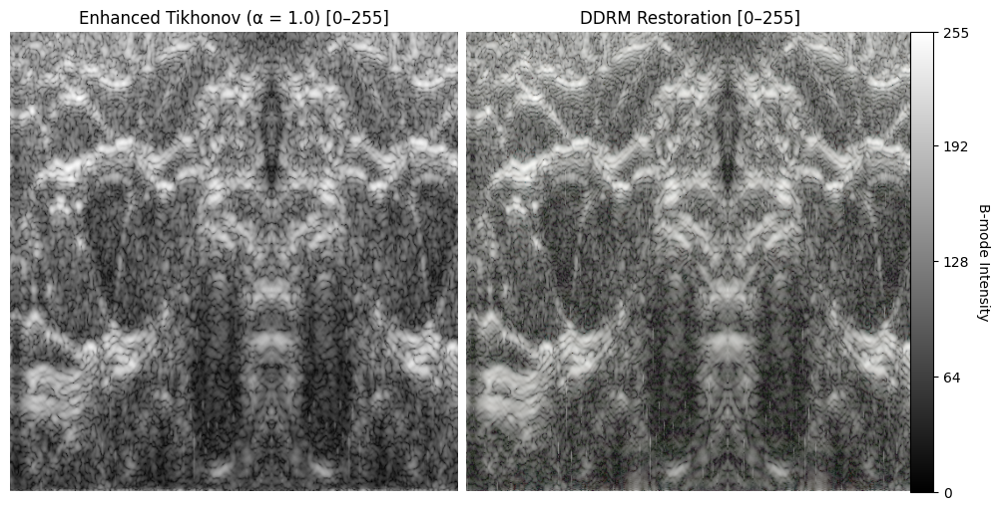

In [63]:
import matplotlib.pyplot as plt
import numpy as np

# 1) Convert from [0,1] → [0,255]
bmode_tk_255   = np.round(bmode_tk1   * 255).astype(np.uint8)
bmode_ddrm_255 = np.round(bmode_ddrm * 255).astype(np.uint8)

# 2) Plot side-by-side with a shared colorbar spanning 0–255
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left: Enhanced Tikhonov
im1 = axes[0].imshow(bmode_tk_255, cmap='gray', aspect='auto', vmin=0, vmax=255)
axes[0].set_title("Enhanced Tikhonov (α = 1.0) [0–255]")
axes[0].axis('off')

# Right: DDRM Restoration
im2 = axes[1].imshow(bmode_ddrm_255, cmap='gray', aspect='auto', vmin=0, vmax=255)
axes[1].set_title("DDRM Restoration [0–255]")
axes[1].axis('off')

# 3) Add a single vertical colorbar (0 → 255)
cbar = fig.colorbar(im2, ax=axes.ravel().tolist(), orientation='vertical',
                    fraction=0.03, pad=0.02, ticks=[0, 64, 128, 192, 255])
cbar.set_label('B-mode Intensity', rotation=270, labelpad=15)

# 4) Manually adjust layout to avoid tight_layout warnings
plt.subplots_adjust(wspace=0.02, right=0.88)
plt.show()


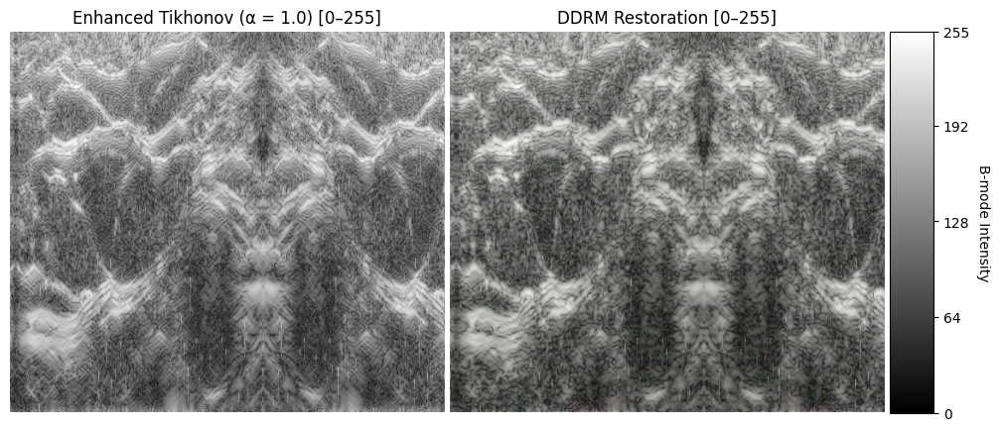

In [67]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# ─────────────────────────────────────────────────────────────────────────────
# 1) LOAD DDRM RESTORED IMAGE
# ─────────────────────────────────────────────────────────────────────────────
ddrm_mat = scipy.io.loadmat("exp/image_samples/NewVivoData/0_-1.mat")
ddrm = ddrm_mat["image"]                   # shape (C, H, W)
ddrm = np.transpose(ddrm, (1, 2, 0))       # → (H, W, C)
# If you want grayscale, uncomment:
# ddrm = np.mean(ddrm, axis=2)

# ─────────────────────────────────────────────────────────────────────────────
# 2) LOAD YOUR ENHANCED TIKHONOV (α=1.0) RESULT
#    (Assumes `enhanced_tk` is already in your namespace from earlier code)
# ─────────────────────────────────────────────────────────────────────────────
# e.g., enhanced_tk = enhanced_tikhonov(RF, D, alpha=1.0)

# ─────────────────────────────────────────────────────────────────────────────
# 3) B-MODE CONVERSION FUNCTION
# ─────────────────────────────────────────────────────────────────────────────
def to_bmode(im, offset=1e-3, dr=60):
    """
    Converts a 2D RF‐like image (can be negative or positive) 
    into a log‐compressed B-mode in [0,1].
    """
    env = np.abs(hilbert(im, axis=0))
    if np.max(env) > 0:
        env = env / np.max(env)
    log_env = 20 * np.log10(env + offset)
    log_env = np.clip(log_env, -dr, 0)
    return (log_env + dr) / dr  # result ∈ [0,1]

# ─────────────────────────────────────────────────────────────────────────────
# 4) COMPUTE B-MODE AND SCALE TO [0-255]
# ─────────────────────────────────────────────────────────────────────────────
bmode_ddrm = to_bmode(ddrm)
bmode_tk   = to_bmode(enhanced_tk)

# Convert float [0,1] → uint8 [0,255]
bmode_ddrm_255 = np.round(bmode_ddrm * 255).astype(np.uint8)
bmode_tk_255   = np.round(bmode_tk   * 255).astype(np.uint8)

# ─────────────────────────────────────────────────────────────────────────────
# 5) PLOT WITH A SEPARATE COLORBAR AXIS
# ─────────────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(12, 5))

# Create a 1×3 grid: [TK image | DDRM image | colorbar]
# width_ratios: make the colorbar column narrow (0.1)
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.1], wspace=0.02)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
cax = fig.add_subplot(gs[0, 2])

# Left panel: Enhanced Tikhonov
im1 = ax1.imshow(bmode_tk_255, cmap="gray", aspect="auto", vmin=0, vmax=255)
ax1.set_title("Enhanced Tikhonov (α = 1.0) [0–255]")
ax1.axis("off")

# Middle panel: DDRM Restoration
im2 = ax2.imshow(bmode_ddrm_255, cmap="gray", aspect="auto", vmin=0, vmax=255)
ax2.set_title("DDRM Restoration [0–255]")
ax2.axis("off")

# Right panel: standalone colorbar
cbar = fig.colorbar(im2, cax=cax, orientation="vertical", ticks=[0, 64, 128, 192, 255])
cbar.set_label("B-mode Intensity", rotation=270, labelpad=15)

plt.show()


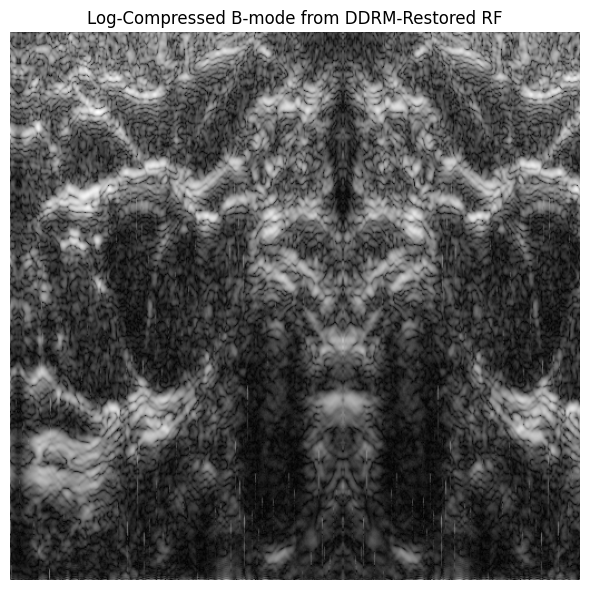

In [73]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Load DDRM-restored RF data
ddrm_mat = scipy.io.loadmat("exp/image_samples/NewVivoData/0_-1.mat")
ddrm = ddrm_mat["image"]                   # shape: (C, H, W)
ddrm = np.transpose(ddrm, (1, 2, 0))       # → (H, W, C)

# Convert to grayscale RF slice
rf_slice = np.mean(ddrm, axis=2)           # average across channels

# Hilbert transform along axial (depth) axis
env = np.abs(hilbert(rf_slice, axis=0))

# Log compression
LogB = 100
log_env = np.log(env + LogB)

# Display log-compressed B-mode image
plt.figure(figsize=(6, 6))
plt.imshow(log_env, cmap='gray', aspect='auto')
plt.title('Log-Compressed B-mode from DDRM-Restored RF')
plt.axis('off')
plt.tight_layout()
plt.show()


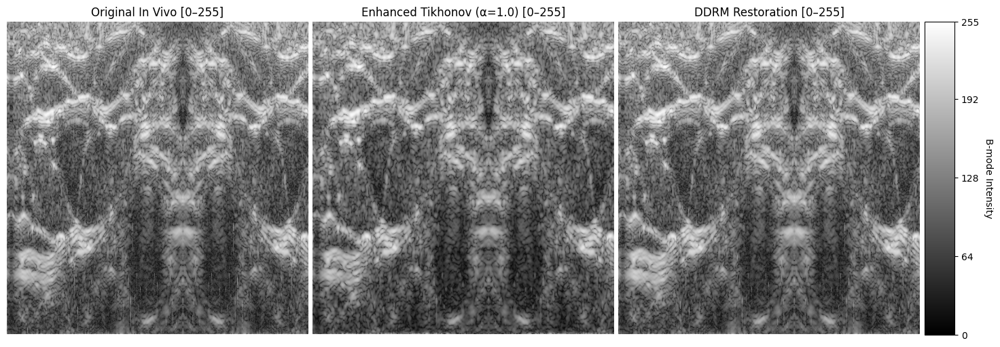


=== Quantitative Comparison vs. Original ===
Method			Contrast×	Sharpness×	SNR (dB)
------------------------------------------------------------
Tikhonov α=1.0      	1.01		0.89		10.02
DDRM                	1.00		0.96		18.63


In [50]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# ─────────────────────────────────────────────────────────────────────────────
# 1) LOAD PSF AND RF DATA
# ─────────────────────────────────────────────────────────────────────────────
psf_data = scipy.io.loadmat('exp/datasets/NewVivoData/psf.mat')
psf = psf_data['psf'].astype(np.float64)
psf /= np.sum(np.abs(psf))

rf_mat = scipy.io.loadmat('exp/datasets/NewVivoData/rfData.mat')
data = rf_mat['data'].astype(np.float64)

# Normalize RF for Tikhonov
rfn = data / np.max(np.abs(data))

# Build the BCCB operator D (FFT of padded + centered PSF)
Mh, Nh = psf.shape
M, N = data.shape
pad_z, pad_x = M - Mh, N - Nh
pad_psf = np.pad(psf, ((0, pad_z), (0, pad_x)), mode='constant')

shift_y, shift_x = Mh//2, Nh//2
psf_shifted = np.roll(np.roll(pad_psf, -shift_y, axis=0), -shift_x, axis=1)
D = np.fft.fft2(psf_shifted)

# Compute RF‐domain for Original
RF = np.fft.fft2(rfn)
original_rf = np.fft.ifft2(RF).real

# ─────────────────────────────────────────────────────────────────────────────
# 2) LOAD DDRM RESTORED RF
# ─────────────────────────────────────────────────────────────────────────────
# (Assumes DDRM wrote a file "/mnt/data/0_-1.mat" with variable "image" of shape (C,H,W))
ddrm_mat = scipy.io.loadmat('exp/image_samples/NewVivoData/0_-1.mat')
ddrm_img = ddrm_mat['image']                    # shape (C, H, W)
ddrm_img = np.transpose(ddrm_img, (1, 2, 0))    # → (H, W, C)
# Convert to grayscale if it’s 3‐channel:
ddrm_rf = np.mean(ddrm_img, axis=2)

# ─────────────────────────────────────────────────────────────────────────────
# 3) ENHANCED TIKHONOV (α = 1.0)
# ─────────────────────────────────────────────────────────────────────────────
def enhanced_tikhonov(RF, D, alpha=1.0, contrast_enhance=True):
    """
    RF : 2D FFT of normalized RF
    D  : 2D FFT of padded PSF (BCCB)
    alpha: Tikhonov regularization parameter
    """
    H = np.conj(D) / (np.abs(D)**2 + alpha)
    xf = RF * H
    restored = np.fft.ifft2(xf).real

    if contrast_enhance:
        orig_time = np.fft.ifft2(RF).real
        orig_energy = np.sum(orig_time**2)
        rest_energy = np.sum(restored**2)
        if rest_energy > 0:
            energy_ratio = np.sqrt(orig_energy / rest_energy)
            restored *= energy_ratio

        orig_std = np.std(orig_time)
        rest_std = np.std(restored)
        if rest_std > 0:
            contrast_ratio = orig_std / rest_std
            restored *= min(contrast_ratio, 2.0)

    return restored

enhanced_tk_1 = enhanced_tikhonov(RF, D, alpha=1.0)

# ─────────────────────────────────────────────────────────────────────────────
# 4) B-MODE CONVERSION (0 → 1)
# ─────────────────────────────────────────────────────────────────────────────
def to_bmode(im, offset=1e-3, dr=60):
    """
    Convert a 2D RF‐like image (positive or negative values) into 
    a log‐compressed B-mode in [0,1].
    """
    env = np.abs(hilbert(im, axis=0))
    if np.max(env) > 0:
        env /= np.max(env)
    log_env = 20 * np.log10(env + offset)
    log_env = np.clip(log_env, -dr, 0)
    return (log_env + dr) / dr

bmode_orig = to_bmode(original_rf)
bmode_tk1  = to_bmode(enhanced_tk_1)
bmode_ddrm = to_bmode(ddrm_rf)

# ─────────────────────────────────────────────────────────────────────────────
# 5) SCALE B-MODES TO [0 → 255] (uint8)
# ─────────────────────────────────────────────────────────────────────────────
bmode_orig_255 = np.round(bmode_orig * 255).astype(np.uint8)
bmode_tk1_255  = np.round(bmode_tk1  * 255).astype(np.uint8)
bmode_ddrm_255 = np.round(bmode_ddrm * 255).astype(np.uint8)

# ─────────────────────────────────────────────────────────────────────────────
# 6) DISPLAY ALL THREE SIDE-BY-SIDE + SEPARATE COLORBAR
# ─────────────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 6))
gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.1], wspace=0.02)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
cax = fig.add_subplot(gs[0, 3])

# Original
im0 = ax0.imshow(bmode_orig_255, cmap='gray', vmin=0, vmax=255, aspect='auto')
ax0.set_title("Original In Vivo [0–255]")
ax0.axis('off')

# Enhanced Tikhonov (α = 1.0)
im1 = ax1.imshow(bmode_tk1_255, cmap='gray', vmin=0, vmax=255, aspect='auto')
ax1.set_title("Enhanced Tikhonov (α=1.0) [0–255]")
ax1.axis('off')

# DDRM Restoration
im2 = ax2.imshow(bmode_ddrm_255, cmap='gray', vmin=0, vmax=255, aspect='auto')
ax2.set_title("DDRM Restoration [0–255]")
ax2.axis('off')

# Standalone colorbar for [0 → 255]
cbar = fig.colorbar(im2, cax=cax, orientation='vertical', ticks=[0, 64, 128, 192, 255])
cbar.set_label("B-mode Intensity", rotation=270, labelpad=15)

plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 7) QUANTITATIVE METRICS (vs. Original)
# ─────────────────────────────────────────────────────────────────────────────
def compare_metrics(reference, restored):
    ref_b = to_bmode(reference)
    res_b = to_bmode(restored)
    # Contrast ratio
    contrast_ratio = np.std(res_b) / (np.std(ref_b) + 1e-10)
    # Sharpness ratio (mean gradient magnitude)
    gr_ref = np.gradient(ref_b)
    gr_res = np.gradient(res_b)
    sharp_ref = np.mean(np.sqrt(gr_ref[0]**2 + gr_ref[1]**2))
    sharp_res = np.mean(np.sqrt(gr_res[0]**2 + gr_res[1]**2))
    sharpness_ratio = sharp_res / (sharp_ref + 1e-10)
    # SNR (variance-based)
    noise = ref_b - res_b
    snr = 10 * np.log10(np.var(res_b) / (np.var(noise) + 1e-10))
    return contrast_ratio, sharpness_ratio, snr

print("\n=== Quantitative Comparison vs. Original ===")
print("Method\t\t\tContrast×\tSharpness×\tSNR (dB)")
print("-" * 60)
for label, result in [("Tikhonov α=1.0", enhanced_tk_1), ("DDRM", ddrm_rf)]:
    c, s, snr = compare_metrics(original_rf, result)
    print(f"{label:<20}\t{c:.2f}\t\t{s:.2f}\t\t{snr:.2f}")
